In [1]:
import pandas as pd 

In [3]:
df_part7 = pd.read_csv('data/전처리/전처리part7_1.csv', encoding='CP949')
df_part7 

,회사명,거래소코드,회계년도,상장일,상장폐지일_x,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,(주)CMG제약,58820,201112,200108,NaN,0,0,0,제조업,1,...,19.715837,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86
1,(주)CMG제약,58820,201212,200108,NaN,0,0,0,제조업,1,...,18.562172,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42
2,(주)CMG제약,58820,201312,200108,NaN,0,0,0,제조업,1,...,17.604882,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42
3,(주)CMG제약,58820,201412,200108,NaN,0,0,0,제조업,1,...,30.445768,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56
4,(주)CMG제약,58820,201512,200108,NaN,0,0,0,제조업,1,...,28.007199,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12738,흥아해운(주),3280,201312,197606,NaN,0,0,0,운수 및 창고업,0,...,0.000000,795.036390,1.39,6.107006,1.87,5.18,5.70,56.65,27.46,2.02
12739,흥아해운(주),3280,201412,197606,NaN,0,0,0,운수 및 창고업,0,...,0.000000,831.529801,1.35,5.499239,1.84,4.98,5.44,59.77,26.03,2.03
12740,흥아해운(주),3280,201512,197606,NaN,0,0,0,운수 및 창고업,0,...,0.000000,948.600246,1.17,5.113218,1.54,5.83,6.38,68.48,25.33,2.15
12741,흥아해운(주),3280,201612,197606,NaN,0,0,0,운수 및 창고업,0,...,0.000000,1000.623142,0.95,4.964267,1.20,6.98,7.96,56.47,25.24,2.19


### inf, -inf 값 확인

In [4]:
import numpy as np
df_part7[(df_part7 == np.inf).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일_x,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


In [5]:
df_part7[(df_part7 == -np.inf).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일_x,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


In [6]:
df_part7.isna().sum()

회사명                      0
거래소코드                    0
회계년도                     0
상장일                      0
상장폐지일_x              12288
부실기업1                    0
부실기업2                    0
부실기업                     0
업종                       0
경기민감도                    0
총자본증가율                   0
순이익증가율                   0
자기자본증가율                  0
매출액증가율                   0
종업원수증가율                  0
정상영업손익증가율                0
매출액정상영업이익률               0
매출액순이익률                  0
총자본순이익률                  0
총자본정상영업이익률               0
자기자본정상영업이익률              0
자기자본순이익률                 0
금융비용부담률                  0
수지비율                     0
사내유보 대 자기자본비율            0
1주당매출액                   0
1주당순이익                   0
1주당 CASH FLOW            0
1주당순자산                   0
유보율                      0
자기자본구성비율                 0
유동비율                     0
당좌비율                     0
현금비율                     0
매출채권 대 매입채무비율            0
부채비율                     0
이자보상배율                   0
C

## 이상치 제거 전 정규성 검정

### 이상치 제거 전 히스토그램

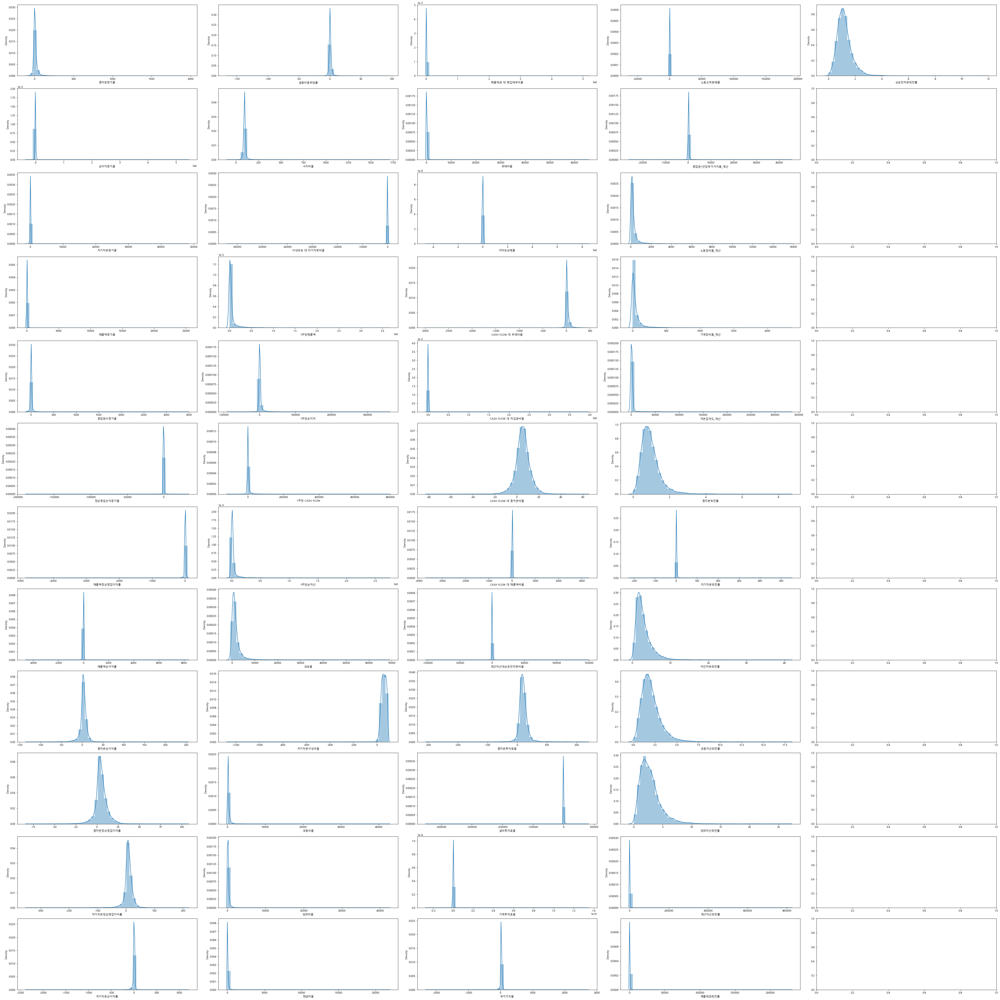

In [7]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(df_part7.columns[10:], axs.T.ravel()):
    sns.distplot(df_part7[col], ax=ax)

plt.show()

### 이상치 제거 전 박스플롯

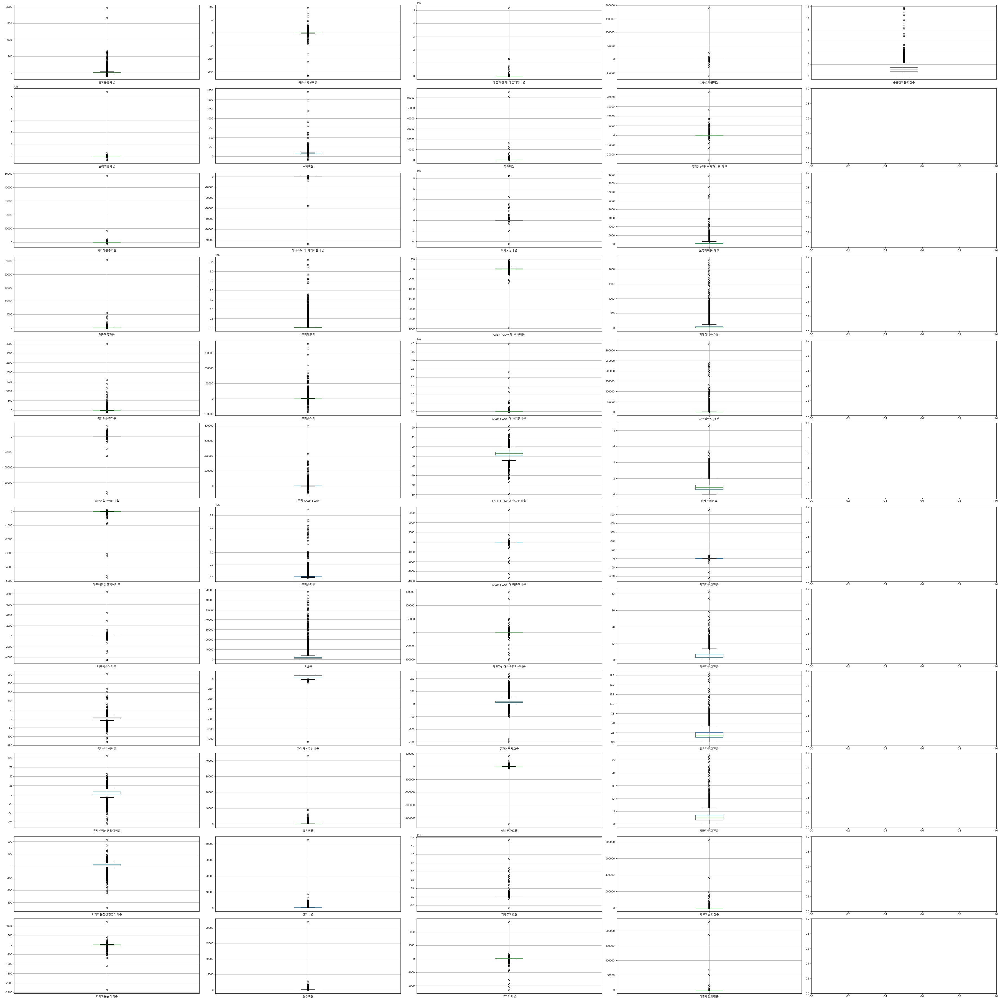

In [8]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(df_part7.columns[10:], axs.T.ravel()):
    df_part7[[col]].boxplot(ax=ax)

plt.show()

### 이상치 제거 전 Q-Q Plot

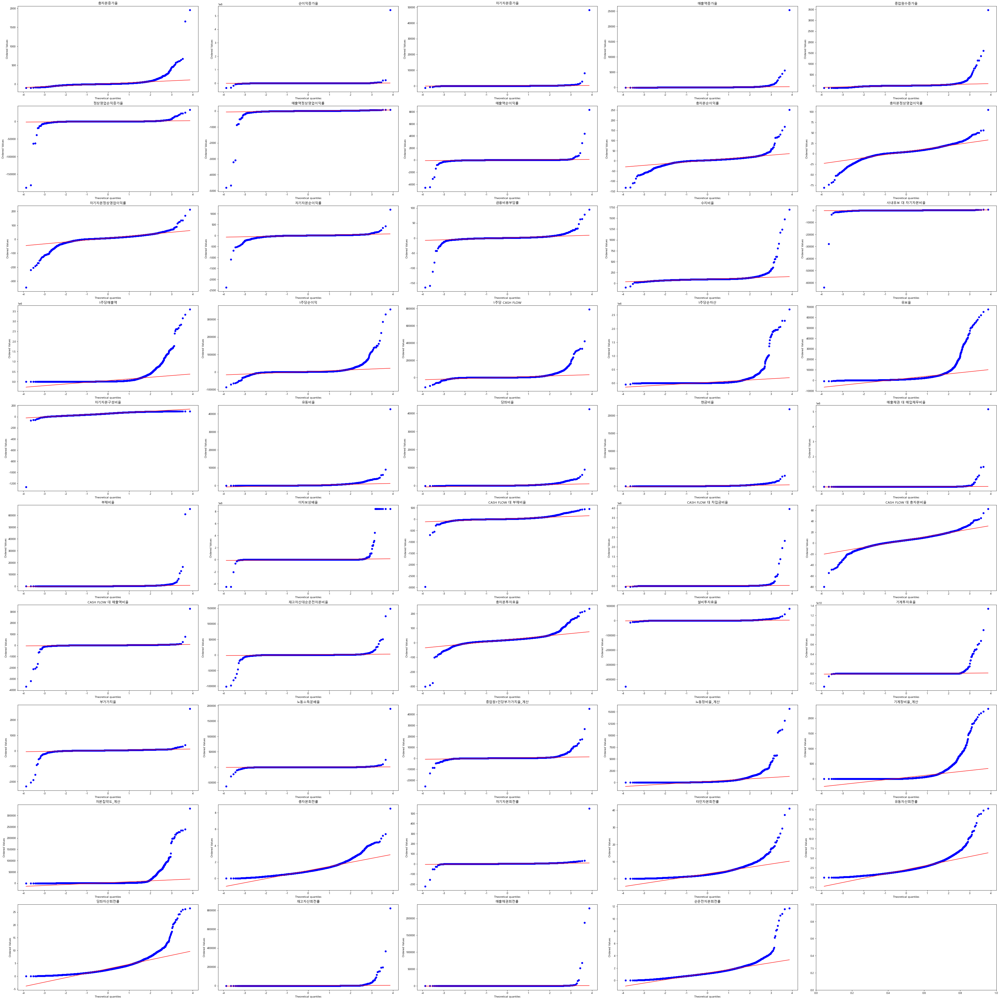

In [9]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), df_part7.iloc[:, 10:]):
       stats.probplot(df_part7[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### 이상치 제거 전 K-S Test

In [10]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [11]:
ks_test(df_part7.iloc[:, 10:])

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 1.628555164044302e-232
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기

### 이상치 제거 전 Shapiro–Wilk test

In [12]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [13]:
# 컬럼별 pvalue 값 출력
shap_pct(df_part7.iloc[:, 10:])

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 등분산, 이분산 확인

## Bartlett

In [22]:
from scipy.stats import bartlett

homosced = []
heterosced = []

bart_df = df_part7.iloc[:, 10:]

nc_df = df_part7[df_part7['부실기업'] ==0]  # normal company 
bc_df = df_part7[df_part7['부실기업'] ==1]  # bankrupt company

bart_sced_df = pd.DataFrame(index=['등분산성'])

for i in bart_df.columns:
    bart_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    bartresult = np.round(bartlett(ser_1, ser_2)[1], 3)
    
    if bartresult < 0.05:
        homosced.append(i)
        bart_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", bartresult,"-> 등분산")
    else:
        heterosced.append(i)
        bart_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", bartresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.001 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.0 -> 등분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
***************************

In [45]:
# 피처별 등분산성 데이터프레임 생성
bart_sced_df = bart_sced_df.transpose()
bart_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,등분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [46]:
bart_sced_df.value_counts()

등분산성
등분산     44
이분산      5
dtype: int64

### 이상치 제거 전 Welch's ttest_ind

In [32]:
import numpy as np
from scipy.stats import ttest_ind

nc_homosced_df = df_part7.loc[:, homosced][df_part7['부실기업'] ==0]  # normal company 
bc_homosced_df = df_part7.loc[:, homosced][df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_homosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [33]:
ttest_homo(nc_homosced_df, bc_homosced_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.006
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.062
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
********************************************************

In [37]:
import numpy as np
from scipy.stats import ttest_ind

nc_heterosced_df = df_part7.loc[:, heterosced][df_part7['부실기업'] ==0]  # normal company 
bc_heterosced_df = df_part7.loc[:, heterosced][df_part7['부실기업'] ==1]  # bankrupt company

# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in nc_heterosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [38]:
ttest_hetero(nc_heterosced_df, bc_heterosced_df)

이분산을 가정한 자기자본구성비율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 유동비율 의 pvalue: 0.14
**********************************************************
이분산을 가정한 총자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 타인자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순운전자본회전률 의 pvalue: 0.0
**********************************************************


## Levene

In [40]:
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = df_part7.iloc[:, 10:]

nc_df = df_part7[df_part7['부실기업'] ==0]  # normal company 
bc_df = df_part7[df_part7['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.005 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.496 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.006 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
***********************

In [41]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [51]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### 이상치 제거 전 Welch's ttest_ind

In [47]:
import numpy as np
from scipy.stats import ttest_ind

# welch_df = df_part7.loc[:, 10:]

nc_homosced_df = df_part7.loc[:, homosced][df_part7['부실기업'] ==0]  # normal company 
bc_homosced_df = df_part7.loc[:, homosced][df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_homosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [49]:
ttest_homo(nc_homosced_df, bc_homosced_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.006
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본순이익률 의 pvalue: 0.0
********************************************************

In [53]:
import numpy as np
from scipy.stats import ttest_ind

# welch_df = df_part7.loc[:, 10:]

nc_heterosced_df = df_part7.loc[:, heterosced][df_part7['부실기업'] ==0]  # normal company 
bc_heterosced_df = df_part7.loc[:, heterosced][df_part7['부실기업'] ==1]  # bankrupt company

# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in nc_heterosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [54]:
ttest_hetero(nc_heterosced_df, bc_heterosced_df)

이분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 유동비율 의 pvalue: 0.14
**********************************************************
이분산을 가정한 당좌비율 의 pvalue: 0.44
**********************************************************
이분산을 가정한 현금비율 의 pvalue: 0.539
**********************************************************
이분산을 가정한 매출채권 대 매입채무비율 의 pvalue: 0.059
**********************************************************
이분산을 가정한 이자보상배율 의 pvalue: 0.017
**********************************************************
이분산을 가정한 CASH FLOW 대 차입금비율 의 pvalue: 0.65
**********************************************************
이분산을 가정한 재고자산대순운전자본비율 의 pvalue: 0.567
**********************************************************
이분산을 가정한 기계투자효율 의 pvalue: 0.055
**********************************************************
이분산을 가정한 종업원1인당부가가치율_계산 의 pvalue: 0.0
**********************************************************
이분산을 가정한 노동장비율_계산 의 pvalue: 0.643
*************************************

## 로그변환 후 정규성 검정

### 로그변환 후 히스토그램

### inf, -inf 값 확인

In [55]:
import numpy as np

df_part7[df_part7.isin([np.inf, -np.inf]).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일_x,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


### 로그 변환

In [56]:
log_df_part7 = np.log1p(df_part7.iloc[:, 10:])

In [57]:
log_df_part7[log_df_part7.isin([np.inf, -np.inf]).any(axis=1)]

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
318,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.198370,6.365779,0.398776,0.918779,0.548121,0.652325,0.883768,1.294727,1.220830,0.398776
364,3.079087,3.828356,2.906450,3.181291,3.382015,3.190076,3.045950,2.937573,2.941804,3.050220,...,0.000000,5.278348,0.693147,0.807805,1.830980,0.951658,0.951658,10.211934,2.444085,0.806476
436,3.210519,NaN,3.428898,NaN,1.383791,NaN,0.641854,0.530628,0.364643,0.451076,...,0.000000,5.403829,0.488580,0.552895,1.646734,0.620576,0.631272,4.088494,1.371181,0.542324
624,3.990987,NaN,NaN,2.631497,1.987874,NaN,NaN,NaN,NaN,-1.714798,...,0.000000,6.989554,0.350657,0.843261,0.476234,0.470004,0.470004,0.000000,1.706565,0.285179
842,1.776498,3.038474,2.120392,0.654511,-inf,3.399388,1.981001,1.827770,1.932970,2.089392,...,0.000002,6.257802,0.756122,0.954312,1.587192,1.011601,1.549688,1.465568,2.374906,0.837248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10997,NaN,NaN,0.884129,NaN,0.647103,NaN,0.982078,1.335001,0.974560,0.688135,...,2.861621,6.181023,0.463734,0.587061,1.432701,0.947789,1.217876,1.740466,2.512846,0.824175
11375,NaN,3.465409,NaN,NaN,NaN,4.000066,NaN,NaN,NaN,NaN,...,5.751806,7.036886,0.542324,1.730820,0.620576,0.806476,1.057790,1.536867,1.460938,0.470004
11562,NaN,5.085120,3.037136,1.987562,-inf,3.930199,2.833213,2.531313,2.729159,3.035434,...,1.541368,5.842399,0.806476,1.285648,1.252763,1.355835,1.430311,3.460095,2.352327,0.900161
11645,NaN,NaN,NaN,0.503129,2.553344,NaN,-inf,NaN,NaN,-1.347074,...,5.348449,6.648856,0.553885,0.897420,0.858662,1.530395,1.786747,2.658159,2.078191,0.806476


### 로그 변환 후 히스토그램

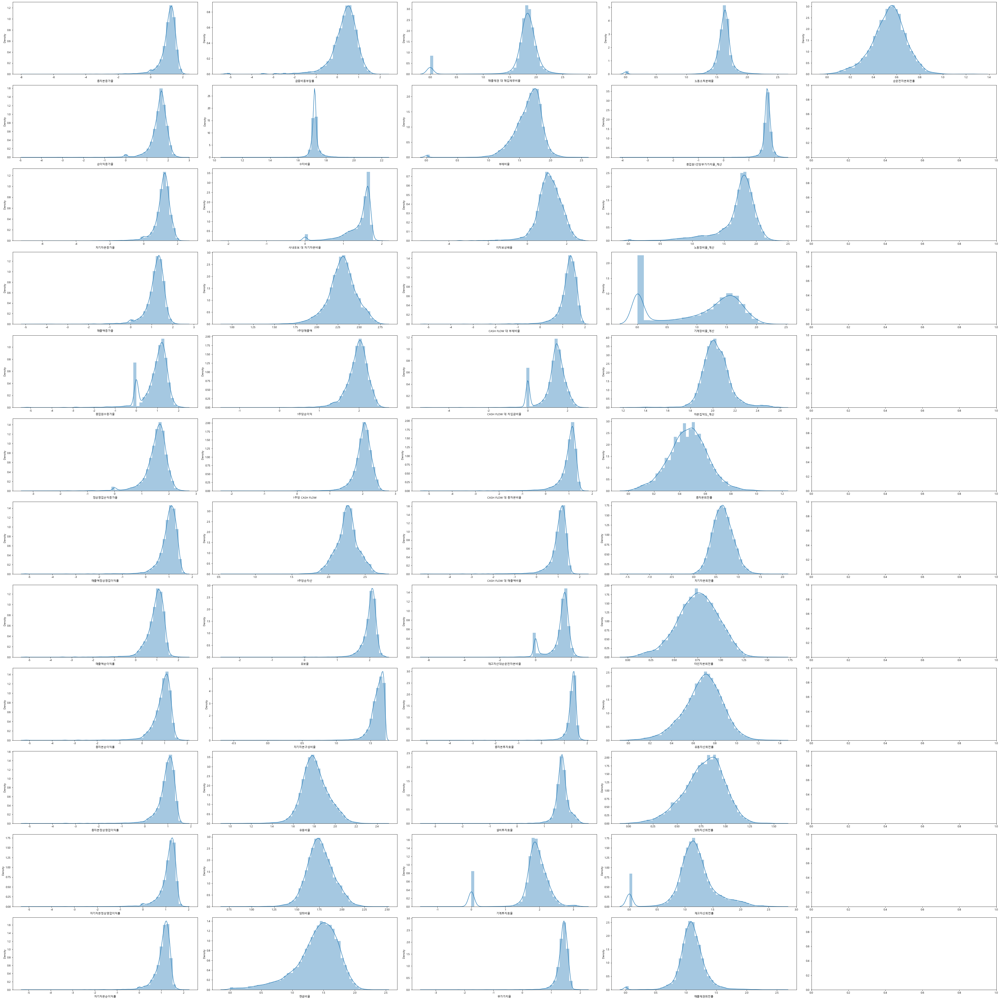

In [23]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for i in log_df_part7.columns:
    log_df_part7[i] = np.log1p(log_df_part7[i])

for col, ax in zip(log_df_part7, axs.T.ravel()):
    sns.distplot(log_df_part7[col], ax=ax)

plt.show()

## 스케일링

### StandardScaler

In [104]:
from sklearn.preprocessing import StandardScaler

sscaler = StandardScaler()
sscaler.fit(df_part7.iloc[:, 10:])

scaled_df_part7 = sscaler.transform(df_part7.iloc[:, 10:])

scaled_df_part7 = pd.DataFrame(scaled_df_part7, columns=df_part7.iloc[:, 10:].columns)

In [105]:
scaled_df_part7

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.038129,-0.006213,-0.026901,0.177793,0.001221,0.492988,0.002422,-0.096454,-0.868161,-0.322687,...,-0.242536,-0.186750,-0.573517,-0.173354,-0.422910,-0.670420,-0.685081,-0.035909,-0.020210,-0.575575
1,2.405612,-0.014917,0.133131,-0.088548,-0.109675,-0.284790,-0.394514,-0.379481,-1.901359,-1.938114,...,-0.251877,-0.166846,-1.083230,-0.230282,-0.933345,-1.275654,-1.194169,-0.035989,-0.020429,-1.311001
2,-0.338274,0.040588,0.087215,0.050893,-0.063794,0.249564,0.006057,-0.009725,-0.250268,-0.449773,...,-0.259628,-0.168088,-1.139865,-0.256014,-0.777379,-1.308817,-1.220143,-0.036025,-0.020349,-1.311001
3,-0.191536,-0.008832,-0.038818,-0.006584,0.329179,-0.010469,-0.020064,-0.016349,-0.274578,-0.531003,...,-0.155660,-0.173221,-1.064352,-0.263276,-0.025904,-1.143000,-1.074689,-0.036094,-0.020425,-1.077002
4,-0.351864,-0.057584,-0.049094,0.023538,-0.194854,-0.255806,-0.174233,-0.140037,-0.948183,-1.221457,...,-0.175404,-0.172471,-0.932204,-0.245956,-0.011726,-0.885983,-0.856509,-0.036044,-0.020338,-0.759431
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12738,-0.113333,-0.007503,0.017463,-0.029358,-0.172222,-0.009424,-0.012389,-0.001793,0.030316,-0.174639,...,-0.402168,-0.133579,0.804597,0.712505,-0.489077,2.587893,1.470748,-0.030278,-0.011098,1.363278
12739,0.051050,-0.007847,-0.021088,-0.024450,0.109237,0.005000,-0.015890,-0.003013,0.001954,-0.234907,...,-0.402168,-0.130295,0.729084,0.607404,-0.503256,2.422076,1.335684,-0.029929,-0.011619,1.379992
12740,0.254378,-0.008750,-0.031089,-0.043973,0.063562,0.012050,-0.012389,-0.011555,-0.155051,-0.246698,...,-0.402168,-0.119762,0.389275,0.540650,-0.645044,3.126800,1.823992,-0.028952,-0.011874,1.580563
12741,0.233368,-0.013301,-0.013185,-0.060416,0.232067,-0.021304,-0.036625,-0.040320,-0.501477,-0.545414,...,-0.402168,-0.115082,-0.026047,0.514892,-0.805736,4.080250,2.644766,-0.030299,-0.011907,1.647420


### StandardScaler 히스토그램

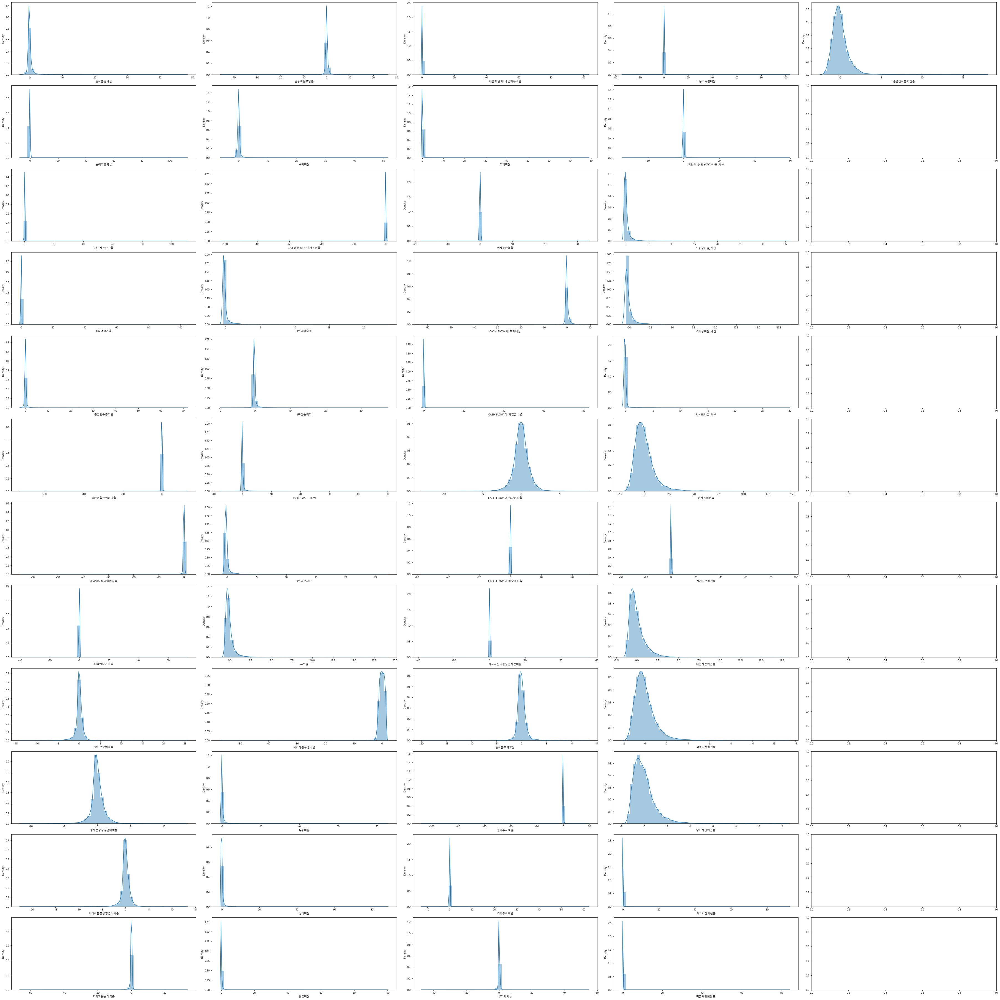

In [62]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(scaled_df_part7, axs.T.ravel()):
    sns.distplot(scaled_df_part7[col], ax=ax)

plt.show()

### StandardScaler 박스플롯

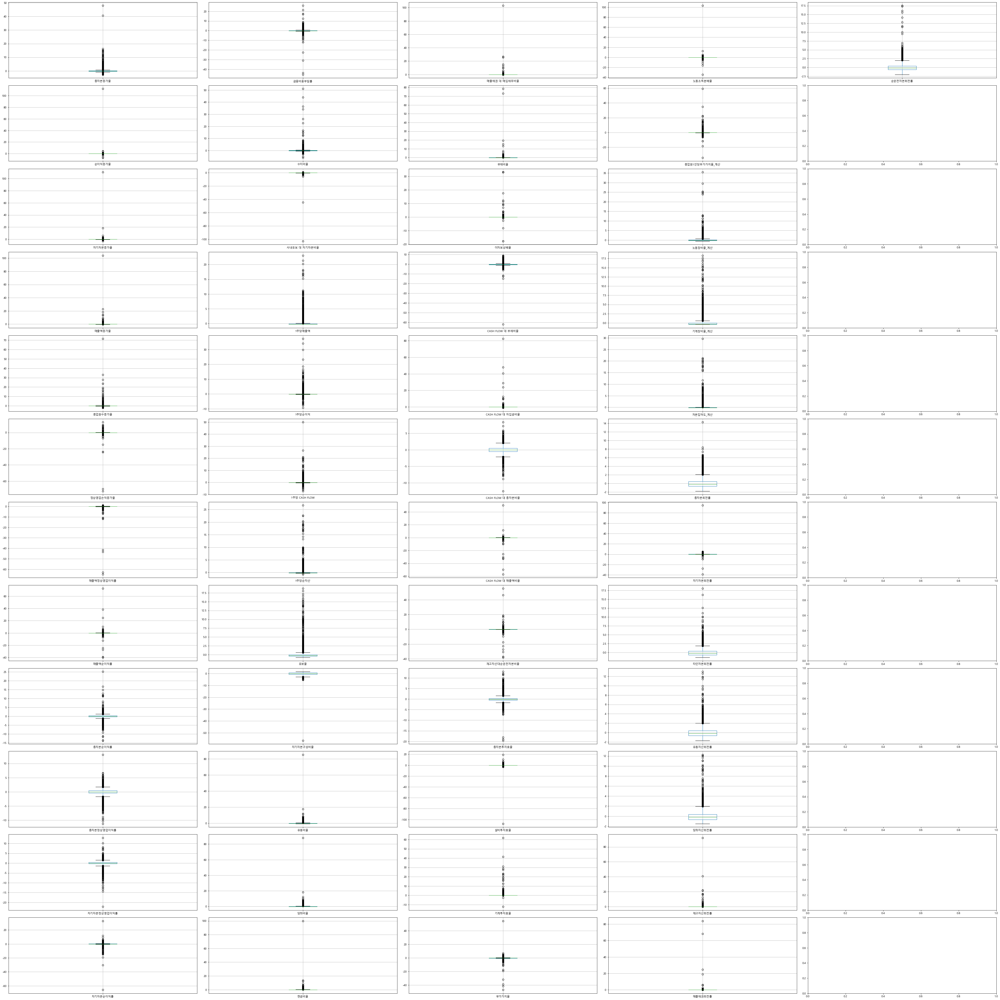

In [63]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(scaled_df_part7, axs.T.ravel()):
    scaled_df_part7[[col]].boxplot(ax=ax)

plt.show()

### StandardScaler Q-Q Plot

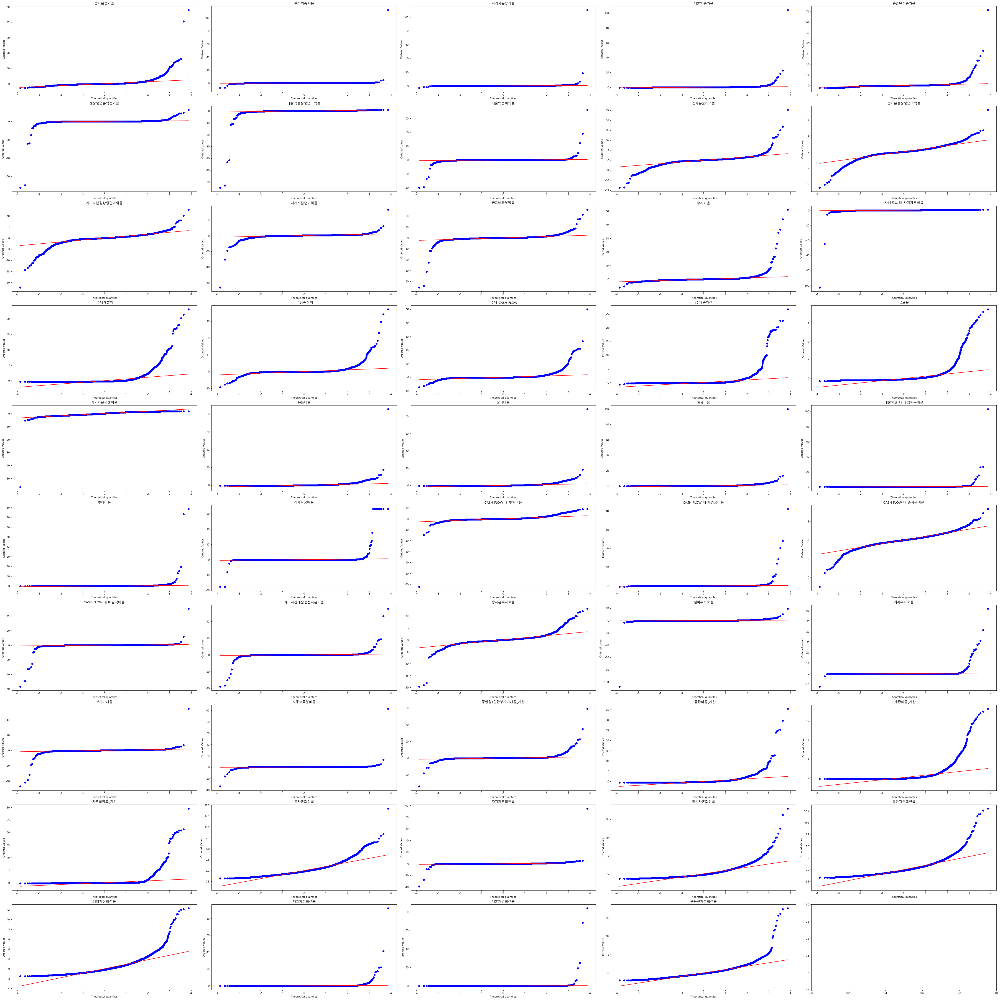

In [64]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), scaled_df_part7):
       stats.probplot(scaled_df_part7[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### StandardScaler K-S Test

In [65]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [66]:
ks_test(scaled_df_part7)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 3.335712e-317
총자본정상영업이익률 의 pvalue: 1.3548933400290125e-153
자기자본정상영업이익률 의 pvalue: 1.0993131461405074e-284
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 2.3357120286177292e-33
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 2.1256484214036183e-37
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 2.742324586133649e-145
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비

### StandardScaler Shapiro–Wilk test

In [67]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [68]:
# 컬럼별 pvalue 값 출력
shap_pct(scaled_df_part7)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### StandardScaler 등분산, 이분산 확인

## Bartlett

In [108]:
scaled_df_part7['부실기업'] = df_part7.iloc[:, 7]
scaled_df_part7.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.038129,-0.006213,-0.026901,0.177793,0.001221,0.492988,0.002422,-0.096454,-0.868161,-0.322687,...,-0.186750,-0.573517,-0.173354,-0.422910,-0.670420,-0.685081,-0.035909,-0.020210,-0.575575,0
1,2.405612,-0.014917,0.133131,-0.088548,-0.109675,-0.284790,-0.394514,-0.379481,-1.901359,-1.938114,...,-0.166846,-1.083230,-0.230282,-0.933345,-1.275654,-1.194169,-0.035989,-0.020429,-1.311001,0
2,-0.338274,0.040588,0.087215,0.050893,-0.063794,0.249564,0.006057,-0.009725,-0.250268,-0.449773,...,-0.168088,-1.139865,-0.256014,-0.777379,-1.308817,-1.220143,-0.036025,-0.020349,-1.311001,0
3,-0.191536,-0.008832,-0.038818,-0.006584,0.329179,-0.010469,-0.020064,-0.016349,-0.274578,-0.531003,...,-0.173221,-1.064352,-0.263276,-0.025904,-1.143000,-1.074689,-0.036094,-0.020425,-1.077002,0
4,-0.351864,-0.057584,-0.049094,0.023538,-0.194854,-0.255806,-0.174233,-0.140037,-0.948183,-1.221457,...,-0.172471,-0.932204,-0.245956,-0.011726,-0.885983,-0.856509,-0.036044,-0.020338,-0.759431,0


In [109]:
from scipy.stats import bartlett

homosced = []
heterosced = []

bart_df = scaled_df_part7.iloc[:, 10:]

nc_df = scaled_df_part7[scaled_df_part7['부실기업'] ==0]  # normal company 
bc_df = scaled_df_part7[scaled_df_part7['부실기업'] ==1]  # bankrupt company

bart_sced_df = pd.DataFrame(index=['등분산성'])

for i in bart_df.columns:
    bart_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    bartresult = np.round(bartlett(ser_1, ser_2)[1], 3)
    
    if bartresult < 0.05:
        homosced.append(i)
        bart_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", bartresult,"-> 등분산")
    else:
        heterosced.append(i)
        bart_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", bartresult,"-> 이분산")
        
    print("**********************************************************")

자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
금융비용부담률 pvalue 0.0 -> 등분산
**********************************************************
수지비율 pvalue 0.0 -> 등분산
**********************************************************
사내유보 대 자기자본비율 pvalue 0.0 -> 등분산
**********************************************************
1주당매출액 pvalue 0.0 -> 등분산
**********************************************************
1주당순이익 pvalue 0.0 -> 등분산
**********************************************************
1주당 CASH FLOW pvalue 0.0 -> 등분산
**********************************************************
1주당순자산 pvalue 0.0 -> 등분산
**********************************************************
유보율 pvalue 0.0 -> 등분산
**********************************************************
자기자본구성비율 pvalue 0.168 -> 이분산
**********************************************************
유동비율 pvalue 0.052 -> 이분산
******************************

In [110]:
# 피처별 등분산성 데이터프레임 생성
bart_sced_df = bart_sced_df.transpose()
bart_sced_df

,등분산성
자기자본정상영업이익률,등분산
자기자본순이익률,등분산
금융비용부담률,등분산
수지비율,등분산
사내유보 대 자기자본비율,등분산
1주당매출액,등분산
1주당순이익,등분산
1주당 CASH FLOW,등분산
1주당순자산,등분산
유보율,등분산


In [111]:
bart_sced_df.value_counts()

등분산성
등분산     34
이분산      6
dtype: int64

### 이상치 제거 전 Welch's ttest_ind

In [112]:
import numpy as np
from scipy.stats import ttest_ind

nc_homosced_df = scaled_df_part7.loc[:, homosced][scaled_df_part7['부실기업'] ==0]  # normal company 
bc_homosced_df = scaled_df_part7.loc[:, homosced][scaled_df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_homosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [113]:
ttest_homo(nc_homosced_df, bc_homosced_df)

등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 금융비용부담률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 수지비율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 사내유보 대 자기자본비율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 1주당매출액 의 pvalue: 0.0
**********************************************************
등분산을 가정한 1주당순이익 의 pvalue: 0.0
**********************************************************
등분산을 가정한 1주당 CASH FLOW 의 pvalue: 0.0
**********************************************************
등분산을 가정한 1주당순자산 의 pvalue: 0.0
**********************************************************
등분산을 가정한 유보율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 당좌비율 의 pvalue: 0.417
**********************************************************
등분산을

In [114]:
import numpy as np
from scipy.stats import ttest_ind

nc_heterosced_df = scaled_df_part7.loc[:, heterosced][scaled_df_part7['부실기업'] ==0]  # normal company 
bc_heterosced_df = scaled_df_part7.loc[:, heterosced][scaled_df_part7['부실기업'] ==1]  # bankrupt company

# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in nc_heterosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [115]:
ttest_hetero(nc_heterosced_df, bc_heterosced_df)

이분산을 가정한 자기자본구성비율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 유동비율 의 pvalue: 0.14
**********************************************************
이분산을 가정한 총자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 타인자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순운전자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 부실기업 의 pvalue: 0.0
**********************************************************


In [116]:
scaled_df_part7['부실기업'] = df_part7.iloc[:, 7]
scaled_df_part7.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.038129,-0.006213,-0.026901,0.177793,0.001221,0.492988,0.002422,-0.096454,-0.868161,-0.322687,...,-0.186750,-0.573517,-0.173354,-0.422910,-0.670420,-0.685081,-0.035909,-0.020210,-0.575575,0
1,2.405612,-0.014917,0.133131,-0.088548,-0.109675,-0.284790,-0.394514,-0.379481,-1.901359,-1.938114,...,-0.166846,-1.083230,-0.230282,-0.933345,-1.275654,-1.194169,-0.035989,-0.020429,-1.311001,0
2,-0.338274,0.040588,0.087215,0.050893,-0.063794,0.249564,0.006057,-0.009725,-0.250268,-0.449773,...,-0.168088,-1.139865,-0.256014,-0.777379,-1.308817,-1.220143,-0.036025,-0.020349,-1.311001,0
3,-0.191536,-0.008832,-0.038818,-0.006584,0.329179,-0.010469,-0.020064,-0.016349,-0.274578,-0.531003,...,-0.173221,-1.064352,-0.263276,-0.025904,-1.143000,-1.074689,-0.036094,-0.020425,-1.077002,0
4,-0.351864,-0.057584,-0.049094,0.023538,-0.194854,-0.255806,-0.174233,-0.140037,-0.948183,-1.221457,...,-0.172471,-0.932204,-0.245956,-0.011726,-0.885983,-0.856509,-0.036044,-0.020338,-0.759431,0


## Levene

In [117]:
from scipy.stats import levene

homosced = []
heterosced = []

# lev_df = scaled_df_part7.iloc[:, :-1]

nc_df = scaled_df_part7[scaled_df_part7['부실기업'] ==0]  # normal company 
bc_df = scaled_df_part7[scaled_df_part7['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")

    print("**********************************************************")

총자본증가율 pvalue 0.005 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.496 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.006 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
***********************

In [118]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [119]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### StandardScaler Welch's ttest_ind

In [120]:
import numpy as np
from scipy.stats import ttest_ind

# welch_df = scaled_df_part7.iloc[:, :-1]

nc_homosced_df = scaled_df_part7.loc[:, homosced][scaled_df_part7['부실기업'] ==0]  # normal company 
bc_homosced_df = scaled_df_part7.loc[:, homosced][scaled_df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_homosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [121]:
ttest_homo(nc_homosced_df, bc_homosced_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.006
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본순이익률 의 pvalue: 0.0
********************************************************

In [122]:
import numpy as np
from scipy.stats import ttest_ind

# welch_df = scaled_df_part7.iloc[:, :-1]

nc_heterosced_df = scaled_df_part7.loc[:, heterosced][scaled_df_part7['부실기업'] ==0]  # normal company 
bc_heterosced_df = scaled_df_part7.loc[:, heterosced][scaled_df_part7['부실기업'] ==1]  # bankrupt company

# 이분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_heterosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [123]:
ttest_hetero(nc_heterosced_df, bc_heterosced_df)

이분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 유동비율 의 pvalue: 0.14
**********************************************************
이분산을 가정한 당좌비율 의 pvalue: 0.44
**********************************************************
이분산을 가정한 현금비율 의 pvalue: 0.539
**********************************************************
이분산을 가정한 매출채권 대 매입채무비율 의 pvalue: 0.059
**********************************************************
이분산을 가정한 이자보상배율 의 pvalue: 0.017
**********************************************************
이분산을 가정한 CASH FLOW 대 차입금비율 의 pvalue: 0.65
**********************************************************
이분산을 가정한 재고자산대순운전자본비율 의 pvalue: 0.567
**********************************************************
이분산을 가정한 기계투자효율 의 pvalue: 0.055
**********************************************************
이분산을 가정한 종업원1인당부가가치율_계산 의 pvalue: 0.0
**********************************************************
이분산을 가정한 노동장비율_계산 의 pvalue: 0.643
*************************************

### MinMaxScaler

In [124]:
from sklearn.preprocessing import MinMaxScaler

mmscaler = MinMaxScaler()
mmscaler.fit(df_part7.iloc[:, 10:])

mmscaled_df_part7 = mmscaler.transform(df_part7.iloc[:, 10:])

mmscaled_df_part7 = pd.DataFrame(mmscaled_df_part7, columns=df_part7.iloc[:, 10:].columns)

In [125]:
mmscaled_df_part7

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.053236,0.058813,0.024943,0.006134,0.029168,0.855967,0.983937,0.352680,0.328319,0.447793,...,0.008533,0.000586,0.077556,0.289091,0.048757,0.069820,0.058201,0.000008,0.000011,0.073504
1,0.099951,0.058740,0.026355,0.003587,0.027662,0.846826,0.977904,0.350160,0.301723,0.381327,...,0.008034,0.001255,0.045828,0.288665,0.022428,0.028716,0.021164,0.000007,0.000008,0.035897
2,0.045808,0.059206,0.025950,0.004921,0.028285,0.853106,0.983992,0.353453,0.344223,0.442564,...,0.007619,0.001213,0.042303,0.288472,0.030473,0.026464,0.019274,0.000007,0.000009,0.035897
3,0.048704,0.058791,0.024837,0.004371,0.033624,0.850050,0.983595,0.353394,0.343598,0.439222,...,0.013177,0.001041,0.047004,0.288417,0.069235,0.037725,0.029856,0.000006,0.000008,0.047863
4,0.045540,0.058382,0.024747,0.004659,0.026505,0.847166,0.981252,0.352292,0.326259,0.410813,...,0.012122,0.001066,0.055229,0.288547,0.069966,0.055180,0.045729,0.000006,0.000009,0.064103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12738,0.050247,0.058802,0.025334,0.004153,0.026812,0.850062,0.983712,0.353523,0.351446,0.453884,...,0.000000,0.002373,0.163337,0.295730,0.045344,0.291104,0.215042,0.000069,0.000119,0.172650
12739,0.053491,0.058799,0.024994,0.004200,0.030636,0.850232,0.983658,0.353512,0.350716,0.451404,...,0.000000,0.002483,0.158637,0.294942,0.044612,0.279842,0.205215,0.000073,0.000113,0.173504
12740,0.057503,0.058792,0.024906,0.004013,0.030015,0.850315,0.983712,0.353436,0.346674,0.450919,...,0.000000,0.002837,0.137485,0.294442,0.037299,0.327703,0.240741,0.000083,0.000110,0.183761
12741,0.057088,0.058754,0.025064,0.003856,0.032304,0.849923,0.983343,0.353180,0.337757,0.438629,...,0.000000,0.002994,0.111633,0.294249,0.029010,0.392455,0.300454,0.000069,0.000110,0.187179


### MinMaxScaler 히스토그램

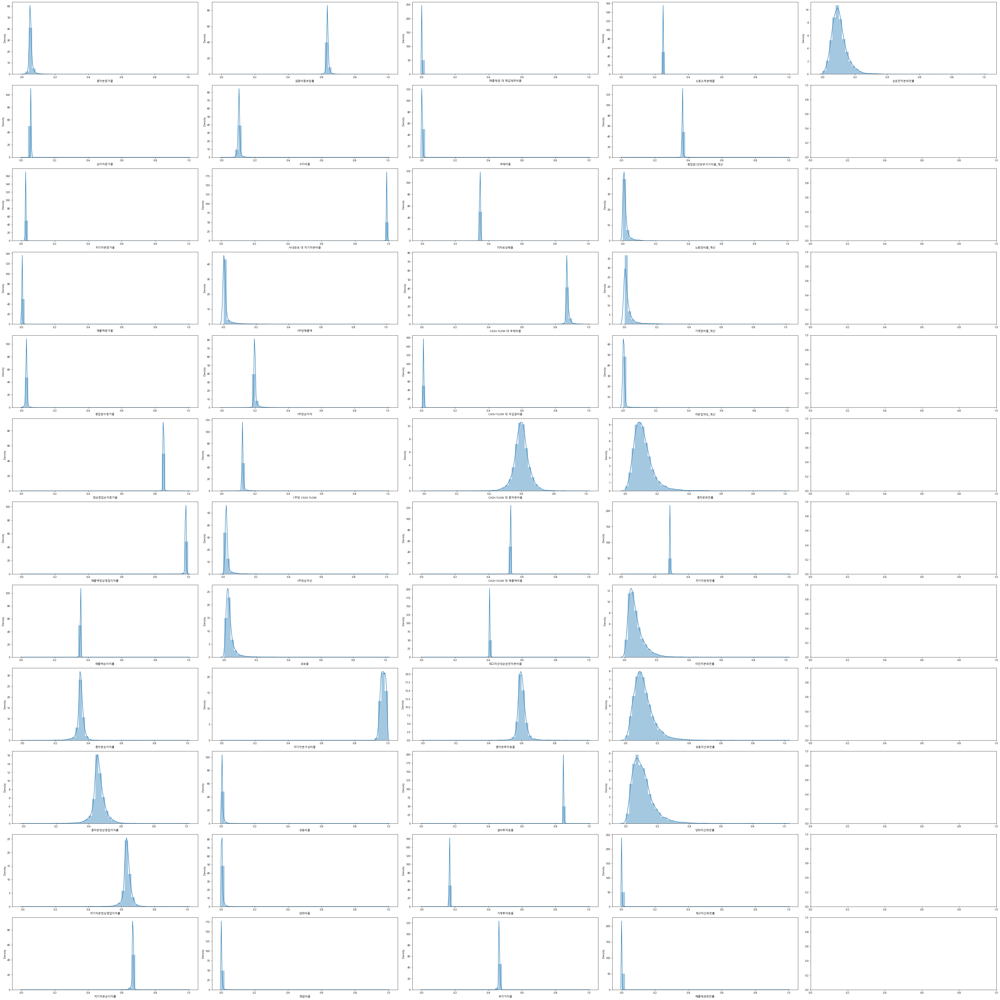

In [87]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(mmscaled_df_part7, axs.T.ravel()):
    sns.distplot(mmscaled_df_part7[col], ax=ax)

plt.show()

### MinMaxScaler 박스플롯

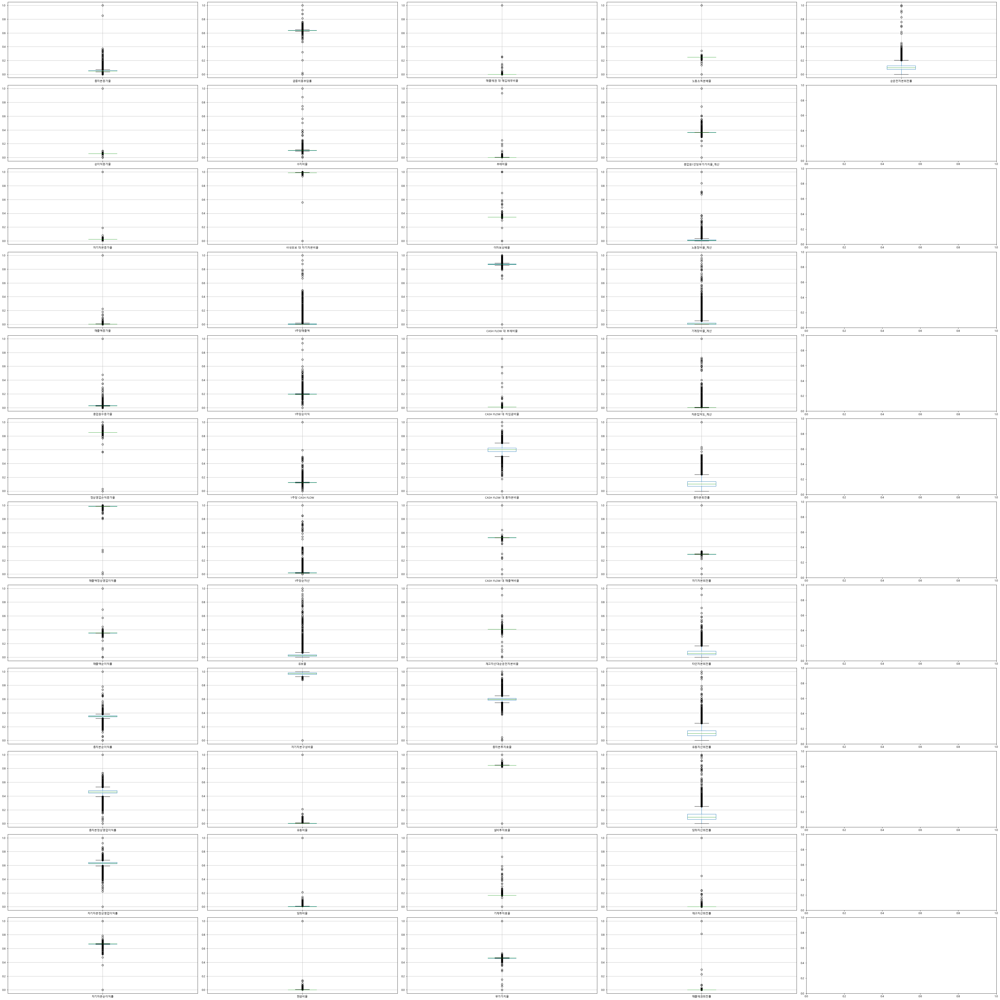

In [88]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(mmscaled_df_part7, axs.T.ravel()):
    mmscaled_df_part7[[col]].boxplot(ax=ax)

plt.show()

### MinMaxScaler Q-Q Plot

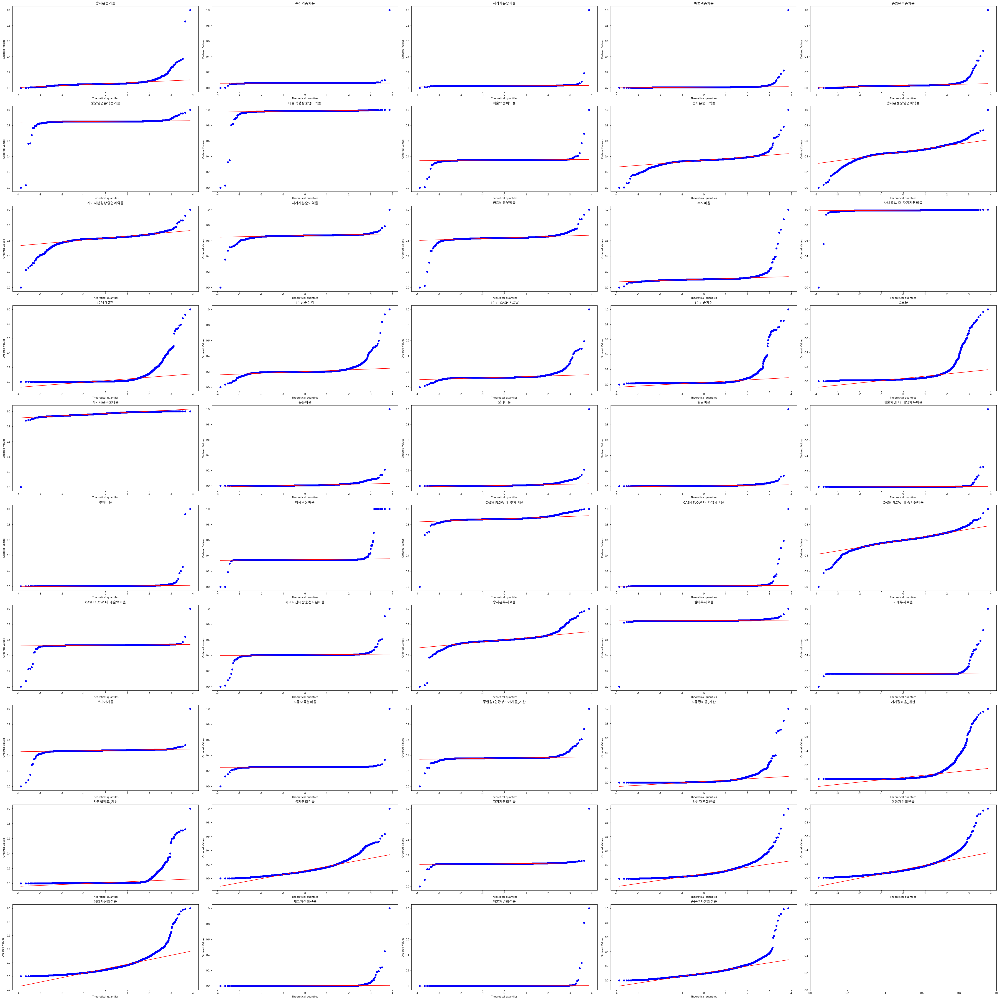

In [89]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), mmscaled_df_part7):
       stats.probplot(mmscaled_df_part7[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### MinMaxScaler K-S Test

In [98]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [99]:
ks_test(mmscaled_df_part7)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### MinMaxScaler Shapiro–Wilk test

In [100]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [101]:
# 컬럼별 pvalue 값 출력
shap_pct(mmscaled_df_part7)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### MinMaxScaler 등분산, 이분산 확인

## Bartlett

In [126]:
mmscaled_df_part7['부실기업'] = df_part7.iloc[:, 7]
mmscaled_df_part7.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.053236,0.058813,0.024943,0.006134,0.029168,0.855967,0.983937,0.352680,0.328319,0.447793,...,0.000586,0.077556,0.289091,0.048757,0.069820,0.058201,0.000008,0.000011,0.073504,0
1,0.099951,0.058740,0.026355,0.003587,0.027662,0.846826,0.977904,0.350160,0.301723,0.381327,...,0.001255,0.045828,0.288665,0.022428,0.028716,0.021164,0.000007,0.000008,0.035897,0
2,0.045808,0.059206,0.025950,0.004921,0.028285,0.853106,0.983992,0.353453,0.344223,0.442564,...,0.001213,0.042303,0.288472,0.030473,0.026464,0.019274,0.000007,0.000009,0.035897,0
3,0.048704,0.058791,0.024837,0.004371,0.033624,0.850050,0.983595,0.353394,0.343598,0.439222,...,0.001041,0.047004,0.288417,0.069235,0.037725,0.029856,0.000006,0.000008,0.047863,0
4,0.045540,0.058382,0.024747,0.004659,0.026505,0.847166,0.981252,0.352292,0.326259,0.410813,...,0.001066,0.055229,0.288547,0.069966,0.055180,0.045729,0.000006,0.000009,0.064103,0


In [128]:
from scipy.stats import bartlett

homosced = []
heterosced = []

bart_df = mmscaled_df_part7.iloc[:, :-1]

nc_df = mmscaled_df_part7[mmscaled_df_part7['부실기업'] ==0]  # normal company 
bc_df = mmscaled_df_part7[mmscaled_df_part7['부실기업'] ==1]  # bankrupt company

bart_sced_df = pd.DataFrame(index=['등분산성'])

for i in bart_df.columns:
    bart_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    bartresult = np.round(bartlett(ser_1, ser_2)[1], 3)
    
    if bartresult < 0.05:
        homosced.append(i)
        bart_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", bartresult,"-> 등분산")
    else:
        heterosced.append(i)
        bart_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", bartresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.001 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.0 -> 등분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
***************************

In [129]:
# 피처별 등분산성 데이터프레임 생성
bart_sced_df = bart_sced_df.transpose()
bart_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,등분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [130]:
bart_sced_df.value_counts()

등분산성
등분산     44
이분산      5
dtype: int64

### 이상치 제거 전 Welch's ttest_ind

In [133]:
import numpy as np
from scipy.stats import ttest_ind

nc_homosced_df = mmscaled_df_part7.loc[:, homosced][mmscaled_df_part7['부실기업'] ==0]  # normal company 
bc_homosced_df = mmscaled_df_part7.loc[:, homosced][mmscaled_df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_homosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [134]:
ttest_homo(nc_homosced_df, bc_homosced_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.006
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.062
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
********************************************************

In [135]:
import numpy as np
from scipy.stats import ttest_ind

nc_heterosced_df = mmscaled_df_part7.loc[:, heterosced][mmscaled_df_part7['부실기업'] ==0]  # normal company 
bc_heterosced_df = mmscaled_df_part7.loc[:, heterosced][mmscaled_df_part7['부실기업'] ==1]  # bankrupt company

# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in nc_heterosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [136]:
ttest_hetero(nc_heterosced_df, bc_heterosced_df)

이분산을 가정한 자기자본구성비율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 유동비율 의 pvalue: 0.14
**********************************************************
이분산을 가정한 총자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 타인자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순운전자본회전률 의 pvalue: 0.0
**********************************************************


## Levene

In [50]:
mmscaled_df_part7['부실기업'] = df_part7.iloc[:, 7]
mmscaled_df_part7.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.053236,0.358996,0.024943,0.001041,0.029168,0.810103,0.995637,0.727216,0.548773,0.480975,...,0.000586,0.077556,0.238812,0.033518,0.062563,0.037731,0.000008,0.000011,0.058030,0
1,0.099951,0.358946,0.026355,0.000609,0.027662,0.806761,0.993998,0.726154,0.530907,0.418503,...,0.001255,0.045828,0.238459,0.015418,0.026026,0.013875,0.000007,0.000008,0.028340,0
2,0.045808,0.359264,0.025950,0.000835,0.028285,0.809057,0.995652,0.727542,0.559458,0.476060,...,0.001213,0.042303,0.238300,0.020949,0.024024,0.012658,0.000007,0.000009,0.028340,0
3,0.048704,0.358981,0.024837,0.000742,0.033624,0.807940,0.995544,0.727517,0.559037,0.472919,...,0.001041,0.047004,0.238255,0.047595,0.034034,0.019474,0.000006,0.000008,0.037787,0
4,0.045540,0.358702,0.024747,0.000791,0.026505,0.806885,0.994907,0.727053,0.547389,0.446218,...,0.001066,0.055229,0.238362,0.048098,0.049550,0.029698,0.000006,0.000009,0.050607,0


In [137]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = mmscaled_df_part7.iloc[:, :-1]

nc_df = mmscaled_df_part7[mmscaled_df_part7['부실기업'] ==0]  # normal company 
bc_df = mmscaled_df_part7[mmscaled_df_part7['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.005 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.496 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.006 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
***********************

In [138]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [139]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### MinMaxScaler Welch's ttest_ind

In [143]:
import numpy as np
from scipy.stats import ttest_ind

# welch_df = mmscaled_df_part7.iloc[:, :-1]

nc_homosced_df = mmscaled_df_part7.loc[:, homosced][mmscaled_df_part7['부실기업'] ==0]  # normal company 
bc_homosced_df = mmscaled_df_part7.loc[:, homosced][mmscaled_df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_homosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [144]:
ttest_homo(nc_homosced_df, bc_homosced_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.006
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본순이익률 의 pvalue: 0.0
********************************************************

In [145]:
import numpy as np
from scipy.stats import ttest_ind

# welch_df = mmscaled_df_part7.iloc[:, :-1]

nc_heterosced_df = mmscaled_df_part7.loc[:, heterosced][mmscaled_df_part7['부실기업'] ==0]  # normal company 
bc_heterosced_df = mmscaled_df_part7.loc[:, heterosced][mmscaled_df_part7['부실기업'] ==1]  # bankrupt company

# 이분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_heterosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [146]:
ttest_hetero(nc_heterosced_df, bc_heterosced_df)

이분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 유동비율 의 pvalue: 0.14
**********************************************************
이분산을 가정한 당좌비율 의 pvalue: 0.44
**********************************************************
이분산을 가정한 현금비율 의 pvalue: 0.539
**********************************************************
이분산을 가정한 매출채권 대 매입채무비율 의 pvalue: 0.059
**********************************************************
이분산을 가정한 이자보상배율 의 pvalue: 0.017
**********************************************************
이분산을 가정한 CASH FLOW 대 차입금비율 의 pvalue: 0.65
**********************************************************
이분산을 가정한 재고자산대순운전자본비율 의 pvalue: 0.567
**********************************************************
이분산을 가정한 기계투자효율 의 pvalue: 0.055
**********************************************************
이분산을 가정한 종업원1인당부가가치율_계산 의 pvalue: 0.0
**********************************************************
이분산을 가정한 노동장비율_계산 의 pvalue: 0.643
*************************************

### RobustScaler

In [147]:
from sklearn.preprocessing import RobustScaler

rbscaler = RobustScaler()
rbscaler.fit(df_part7.iloc[:, 10:])

rbscaled_df_part7 = rbscaler.transform(df_part7.iloc[:, 10:])

rbscaled_df_part7 = pd.DataFrame(rbscaled_df_part7, columns=df_part7.iloc[:, 10:].columns)

In [148]:
rbscaled_df_part7

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.467405,0.708186,-0.042640,2.522737,0.295905,14.243645,-0.166450,-1.619368,-1.411952,-0.307810,...,0.106711,-0.598712,-0.362069,-0.347833,-0.166667,-0.453125,-0.470297,-0.170292,-0.778008,-0.412698
1,6.333047,-2.912998,4.912403,-0.603440,-0.178776,-8.524602,-4.000000,-5.986550,-3.037450,-2.196018,...,0.083122,-0.320312,-0.827586,-0.568856,-0.666667,-1.023438,-0.955446,-0.236002,-0.902490,-1.111111
2,-0.465166,20.180123,3.490712,1.033245,0.017613,7.117764,-0.131339,-0.281103,-0.439841,-0.456355,...,0.063547,-0.337685,-0.879310,-0.668757,-0.513889,-1.054688,-0.980198,-0.265618,-0.856846,-1.111111
3,-0.101609,-0.381308,-0.411619,0.358617,1.699692,-0.494293,-0.383615,-0.383322,-0.478088,-0.551302,...,0.326112,-0.409483,-0.810345,-0.696950,0.222222,-0.898437,-0.841584,-0.322999,-0.900415,-0.888889
4,-0.498836,-20.665103,-0.729804,0.712167,-0.543373,-7.676137,-1.872562,-2.291863,-1.537849,-1.358346,...,0.276249,-0.398992,-0.689655,-0.629708,0.236111,-0.656250,-0.633663,-0.281351,-0.850622,-0.587302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12738,0.092143,0.171417,1.330988,0.091308,-0.446499,-0.463700,-0.309493,-0.158709,0.001594,-0.134763,...,-0.296430,0.144996,0.896552,3.091463,-0.231481,2.617187,1.584158,4.478482,4.410788,1.428571
12739,0.499417,0.028187,0.137338,0.148907,0.758256,-0.041447,-0.343303,-0.177539,-0.043028,-0.205207,...,-0.296430,0.190921,0.827586,2.683416,-0.245370,2.460938,1.455446,4.767237,4.114108,1.444444
12740,1.003179,-0.347277,-0.172307,-0.080239,0.562748,0.164914,-0.309493,-0.309348,-0.290040,-0.218989,...,-0.296430,0.338249,0.517241,2.424247,-0.384259,3.125000,1.920792,5.573346,3.968880,1.634921
12741,0.951127,-2.241000,0.382037,-0.273240,1.284016,-0.811450,-0.543563,-0.753194,-0.835060,-0.568147,...,-0.296430,0.403717,0.137931,2.324243,-0.541667,4.023438,2.702970,4.461823,3.950207,1.698413


### RobustScaler 히스토그램

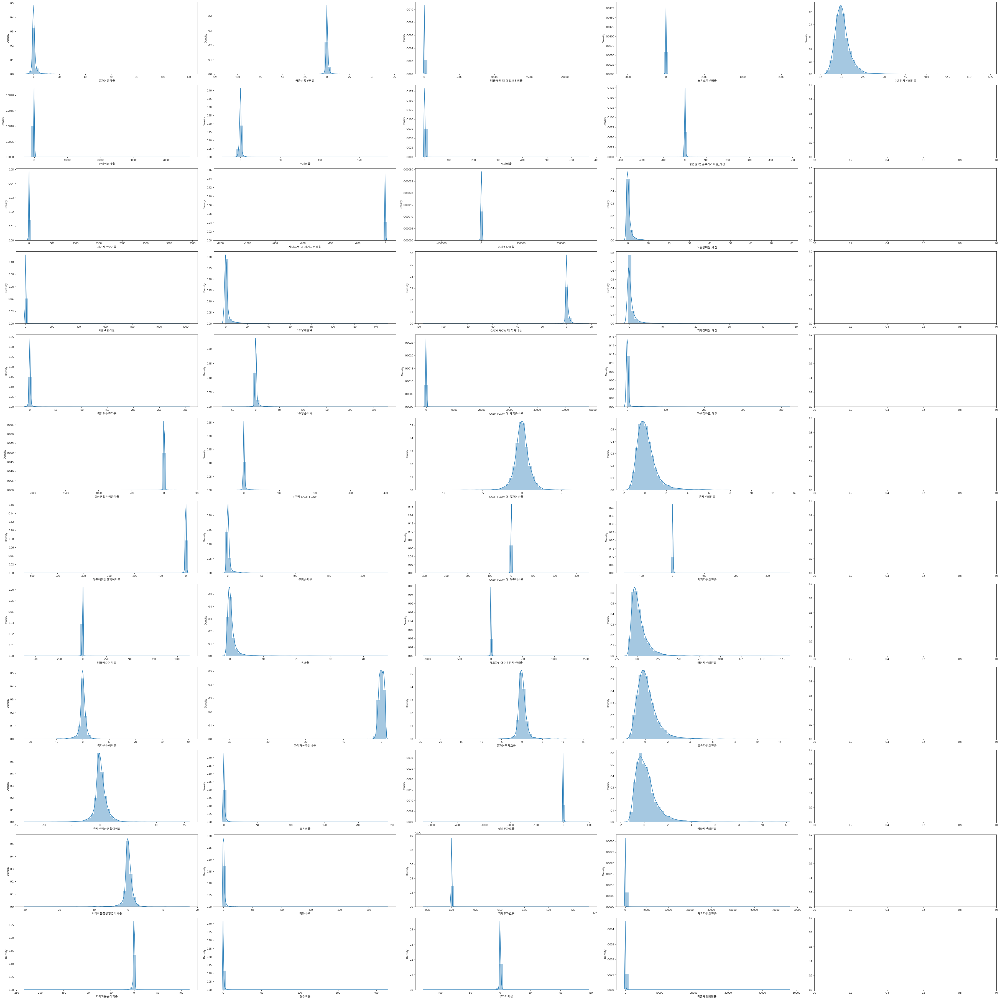

In [149]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(rbscaled_df_part7, axs.T.ravel()):
    sns.distplot(rbscaled_df_part7[col], ax=ax)

plt.show()

### RobustScaler 박스플롯

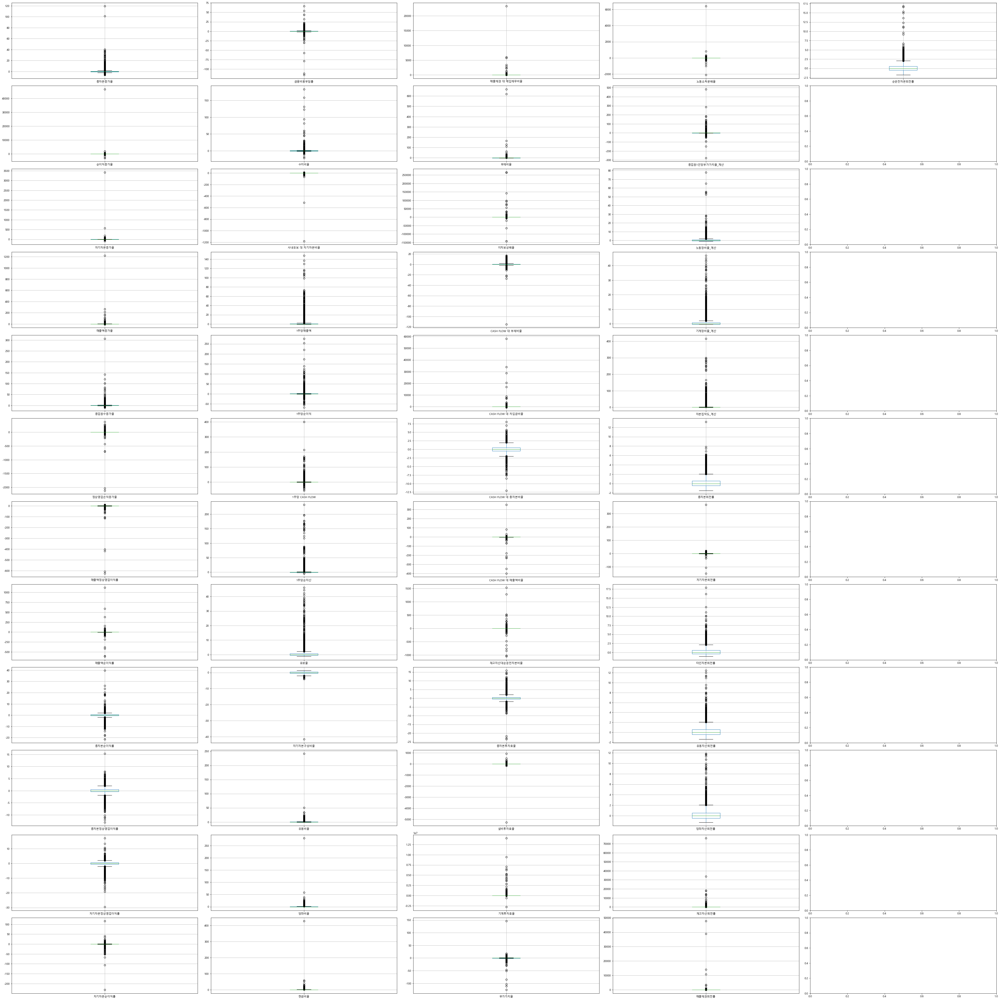

In [150]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(rbscaled_df_part7, axs.T.ravel()):
    rbscaled_df_part7[[col]].boxplot(ax=ax)

plt.show()

### RobustScaler Q-Q Plot

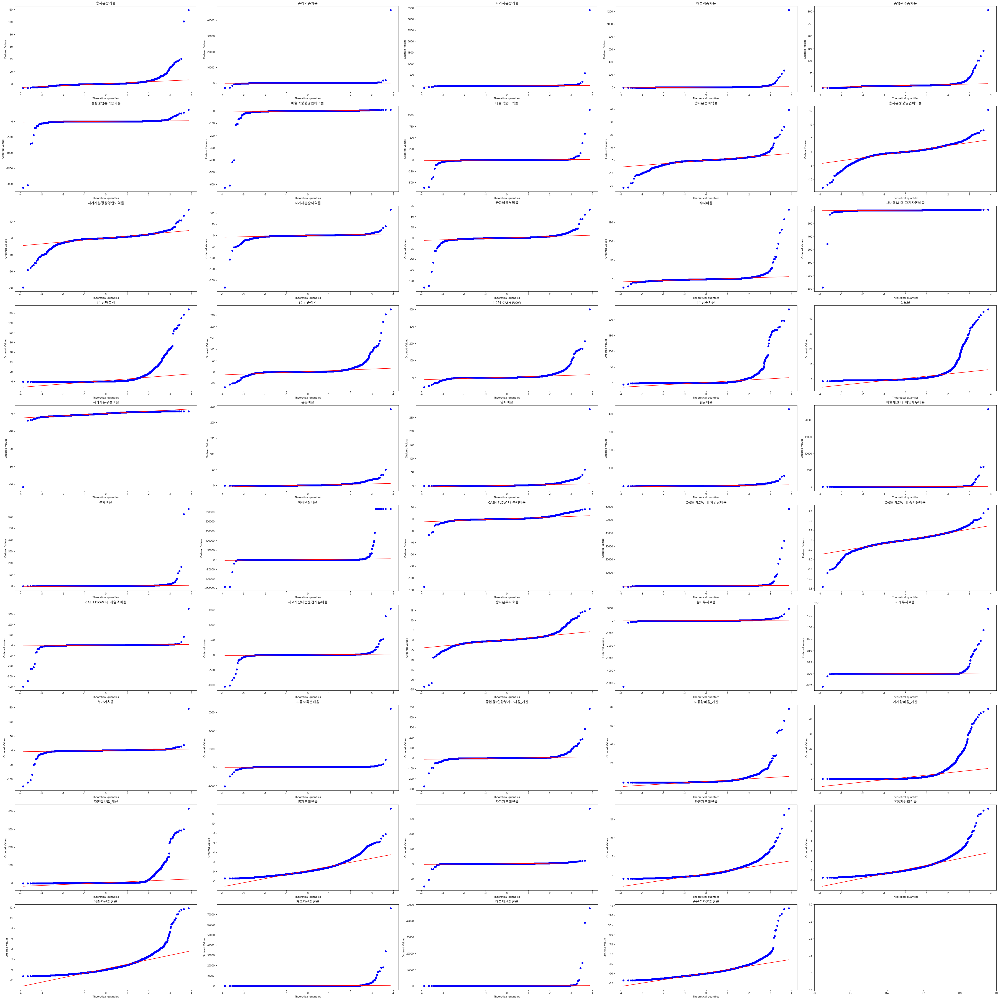

In [151]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), rbscaled_df_part7):
       stats.probplot(rbscaled_df_part7[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### RobustScaler K-S Test

In [152]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [153]:
ks_test(rbscaled_df_part7)

총자본증가율 의 pvalue: 1.5891298863865103e-154
순이익증가율 의 pvalue: 1.8773607304160735e-58
자기자본증가율 의 pvalue: 9.333159845623573e-122
매출액증가율 의 pvalue: 6.758713839850502e-63
종업원수증가율 의 pvalue: 1.8674445480235042e-101
정상영업손익증가율 의 pvalue: 6.663244377217723e-49
매출액정상영업이익률 의 pvalue: 6.933523569952399e-154
매출액순이익률 의 pvalue: 7.042296525723473e-123
총자본순이익률 의 pvalue: 1.2667025264360527e-87
총자본정상영업이익률 의 pvalue: 2.8861074256722565e-124
자기자본정상영업이익률 의 pvalue: 6.643670426092237e-119
자기자본순이익률 의 pvalue: 3.5078895735334474e-58
금융비용부담률 의 pvalue: 7.438599450013025e-104
수지비율 의 pvalue: 1.8239832014794044e-131
사내유보 대 자기자본비율 의 pvalue: 1.0503975355803514e-236
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 4.914227946893287e-179
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 1.3726136538159858e-268
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 

### RobustScaler Shapiro–Wilk test

In [154]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [155]:
# 컬럼별 pvalue 값 출력
shap_pct(rbscaled_df_part7)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### RobustScaler 등분산, 이분산 확인

In [156]:
rbscaled_df_part7['부실기업'] = df_part7.iloc[:, 7]
rbscaled_df_part7.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.467405,0.708186,-0.042640,2.522737,0.295905,14.243645,-0.166450,-1.619368,-1.411952,-0.307810,...,-0.598712,-0.362069,-0.347833,-0.166667,-0.453125,-0.470297,-0.170292,-0.778008,-0.412698,0
1,6.333047,-2.912998,4.912403,-0.603440,-0.178776,-8.524602,-4.000000,-5.986550,-3.037450,-2.196018,...,-0.320312,-0.827586,-0.568856,-0.666667,-1.023438,-0.955446,-0.236002,-0.902490,-1.111111,0
2,-0.465166,20.180123,3.490712,1.033245,0.017613,7.117764,-0.131339,-0.281103,-0.439841,-0.456355,...,-0.337685,-0.879310,-0.668757,-0.513889,-1.054688,-0.980198,-0.265618,-0.856846,-1.111111,0
3,-0.101609,-0.381308,-0.411619,0.358617,1.699692,-0.494293,-0.383615,-0.383322,-0.478088,-0.551302,...,-0.409483,-0.810345,-0.696950,0.222222,-0.898437,-0.841584,-0.322999,-0.900415,-0.888889,0
4,-0.498836,-20.665103,-0.729804,0.712167,-0.543373,-7.676137,-1.872562,-2.291863,-1.537849,-1.358346,...,-0.398992,-0.689655,-0.629708,0.236111,-0.656250,-0.633663,-0.281351,-0.850622,-0.587302,0


## Bartlett

In [157]:
from scipy.stats import bartlett

homosced = []
heterosced = []

bart_df = rbscaled_df_part7.iloc[:, 10:]

nc_df = rbscaled_df_part7[rbscaled_df_part7['부실기업'] ==0]  # normal company 
bc_df = rbscaled_df_part7[rbscaled_df_part7['부실기업'] ==1]  # bankrupt company

bart_sced_df = pd.DataFrame(index=['등분산성'])

for i in bart_df.columns:
    bart_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    bartresult = np.round(bartlett(ser_1, ser_2)[1], 3)
    
    if bartresult < 0.05:
        homosced.append(i)
        bart_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", bartresult,"-> 등분산")
    else:
        heterosced.append(i)
        bart_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", bartresult,"-> 이분산")
        
    print("**********************************************************")

자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
금융비용부담률 pvalue 0.0 -> 등분산
**********************************************************
수지비율 pvalue 0.0 -> 등분산
**********************************************************
사내유보 대 자기자본비율 pvalue 0.0 -> 등분산
**********************************************************
1주당매출액 pvalue 0.0 -> 등분산
**********************************************************
1주당순이익 pvalue 0.0 -> 등분산
**********************************************************
1주당 CASH FLOW pvalue 0.0 -> 등분산
**********************************************************
1주당순자산 pvalue 0.0 -> 등분산
**********************************************************
유보율 pvalue 0.0 -> 등분산
**********************************************************
자기자본구성비율 pvalue 0.168 -> 이분산
**********************************************************
유동비율 pvalue 0.052 -> 이분산
******************************

In [158]:
# 피처별 등분산성 데이터프레임 생성
bart_sced_df = bart_sced_df.transpose()
bart_sced_df

,등분산성
자기자본정상영업이익률,등분산
자기자본순이익률,등분산
금융비용부담률,등분산
수지비율,등분산
사내유보 대 자기자본비율,등분산
1주당매출액,등분산
1주당순이익,등분산
1주당 CASH FLOW,등분산
1주당순자산,등분산
유보율,등분산


In [159]:
bart_sced_df.value_counts()

등분산성
등분산     34
이분산      6
dtype: int64

### 이상치 제거 전 Welch's ttest_ind

In [160]:
import numpy as np
from scipy.stats import ttest_ind

nc_homosced_df = rbscaled_df_part7.loc[:, homosced][rbscaled_df_part7['부실기업'] ==0]  # normal company 
bc_homosced_df = rbscaled_df_part7.loc[:, homosced][rbscaled_df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_homosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [161]:
ttest_homo(nc_homosced_df, bc_homosced_df)

등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 금융비용부담률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 수지비율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 사내유보 대 자기자본비율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 1주당매출액 의 pvalue: 0.0
**********************************************************
등분산을 가정한 1주당순이익 의 pvalue: 0.0
**********************************************************
등분산을 가정한 1주당 CASH FLOW 의 pvalue: 0.0
**********************************************************
등분산을 가정한 1주당순자산 의 pvalue: 0.0
**********************************************************
등분산을 가정한 유보율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 당좌비율 의 pvalue: 0.417
**********************************************************
등분산을

In [162]:
import numpy as np
from scipy.stats import ttest_ind

nc_heterosced_df = rbscaled_df_part7.loc[:, heterosced][rbscaled_df_part7['부실기업'] ==0]  # normal company 
bc_heterosced_df = rbscaled_df_part7.loc[:, heterosced][rbscaled_df_part7['부실기업'] ==1]  # bankrupt company

# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in nc_heterosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [163]:
ttest_hetero(nc_heterosced_df, bc_heterosced_df)

이분산을 가정한 자기자본구성비율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 유동비율 의 pvalue: 0.14
**********************************************************
이분산을 가정한 총자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 타인자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순운전자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 부실기업 의 pvalue: 0.0
**********************************************************


In [164]:
rbscaled_df_part7['부실기업'] = df_part7.iloc[:, 7]
rbscaled_df_part7.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.467405,0.708186,-0.042640,2.522737,0.295905,14.243645,-0.166450,-1.619368,-1.411952,-0.307810,...,-0.598712,-0.362069,-0.347833,-0.166667,-0.453125,-0.470297,-0.170292,-0.778008,-0.412698,0
1,6.333047,-2.912998,4.912403,-0.603440,-0.178776,-8.524602,-4.000000,-5.986550,-3.037450,-2.196018,...,-0.320312,-0.827586,-0.568856,-0.666667,-1.023438,-0.955446,-0.236002,-0.902490,-1.111111,0
2,-0.465166,20.180123,3.490712,1.033245,0.017613,7.117764,-0.131339,-0.281103,-0.439841,-0.456355,...,-0.337685,-0.879310,-0.668757,-0.513889,-1.054688,-0.980198,-0.265618,-0.856846,-1.111111,0
3,-0.101609,-0.381308,-0.411619,0.358617,1.699692,-0.494293,-0.383615,-0.383322,-0.478088,-0.551302,...,-0.409483,-0.810345,-0.696950,0.222222,-0.898437,-0.841584,-0.322999,-0.900415,-0.888889,0
4,-0.498836,-20.665103,-0.729804,0.712167,-0.543373,-7.676137,-1.872562,-2.291863,-1.537849,-1.358346,...,-0.398992,-0.689655,-0.629708,0.236111,-0.656250,-0.633663,-0.281351,-0.850622,-0.587302,0


## Levene

In [165]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = rbscaled_df_part7.iloc[:, :-1]

nc_df = rbscaled_df_part7[rbscaled_df_part7['부실기업'] ==0]  # normal company 
bc_df = rbscaled_df_part7[rbscaled_df_part7['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.005 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.496 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.006 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
***********************

In [166]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [167]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### RobustScaler Welch's ttest_ind

In [169]:
import numpy as np
from scipy.stats import ttest_ind

# welch_df = rbscaled_df_part7.iloc[:, :-1]

nc_homosced_df = rbscaled_df_part7.loc[:, homosced][rbscaled_df_part7['부실기업'] ==0]  # normal company 
bc_homosced_df = rbscaled_df_part7.loc[:, homosced][rbscaled_df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_homosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [170]:
ttest_homo(nc_homosced_df, bc_homosced_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.006
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본순이익률 의 pvalue: 0.0
********************************************************

In [73]:
import numpy as np
from scipy.stats import ttest_ind

# welch_df = rbscaled_df_part7.iloc[:, :-1]

nc_heterosced_df = rbscaled_df_part7.loc[:, heterosced][rbscaled_df_part7['부실기업'] ==0]  # normal company 
bc_heterosced_df = rbscaled_df_part7.loc[:, heterosced][rbscaled_df_part7['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in nc_heterosced_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [171]:
ttest_hetero(nc_heterosced_df, bc_heterosced_df)

이분산을 가정한 자기자본구성비율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 유동비율 의 pvalue: 0.14
**********************************************************
이분산을 가정한 총자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 타인자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순운전자본회전률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 부실기업 의 pvalue: 0.0
**********************************************************


## 이상치 제거 후 정규성 검정

### IQR

In [75]:
# 이상치 인덱스 확인

q1 = df_part7['총자본증가율'].quantile(0.25)
q3 = df_part7['총자본증가율'].quantile(0.75)
iqr = q3-q1

condition1 = df_part7['총자본증가율']>q3+1.5*iqr
condition2 = df_part7['총자본증가율']<q1-1.5*iqr
a = df_part7[condition1].index
b = df_part7[condition2].index

print(a)
print(b)

Int64Index([    1,     5,     8,    25,    28,    29,    46,    67,   100,
              130,
            ...
            16429, 16437, 16478, 16590, 16599, 16600, 16603, 16607, 16608,
            16610],
           dtype='int64', length=1288)
Int64Index([   10,    37,    43,    90,    92,    95,   104,   137,   138,
              146,
            ...
            16331, 16393, 16500, 16519, 16593, 16597, 16601, 16624, 16632,
            16633],
           dtype='int64', length=517)


In [76]:
iqr_list = ['총자본증가율', '순이익증가율', '자기자본증가율', '매출액증가율', '종업원수증가율',
       '정상영업손익증가율', '매출액정상영업이익률', '매출액순이익률', '총자본순이익률', '총자본정상영업이익률',
       '자기자본정상영업이익률', '자기자본순이익률', '금융비용부담률', '수지비율', '사내유보 대 자기자본비율', '1주당매출액',
       '1주당순이익', '1주당 CASH FLOW', '1주당순자산', '유보율', '자기자본구성비율', '유동비율', '당좌비율',
       '현금비율', '매출채권 대 매입채무비율', '부채비율', '이자보상배율', 'CASH FLOW 대 부채비율',
       'CASH FLOW 대 차입금비율', 'CASH FLOW 대 총자본비율', 'CASH FLOW 대 매출액비율',
       '재고자산대순운전자본비율', '총자본투자효율', '설비투자효율', '기계투자효율', '부가가치율', '노동소득분배율',
       '종업원1인당부가가치율_계산', '노동장비율_계산', '기계장비율_계산', '자본집약도_계산', '총자본회전률',
       '자기자본회전률', '타인자본회전률', '유동자산회전률', '당좌자산회전률', '재고자산회전률', '매출채권회전률',
       '순운전자본회전률']

In [77]:
cols = []

iqr_df = df_part7[iqr_list]
cols.append([col for col in iqr_df])

Q1 = iqr_df[iqr_list].quantile(q=0.25)
Q3 = iqr_df[iqr_list].quantile(q=0.75)
IQR = Q3-Q1

for i in cols:
       iqr_df[i] = iqr_df[i][(iqr_df[i] <= Q3[i]+1.5*IQR[i]) & (iqr_df[i] >= Q1[i]-1.5*IQR[i])]

### IQR 히스토그램

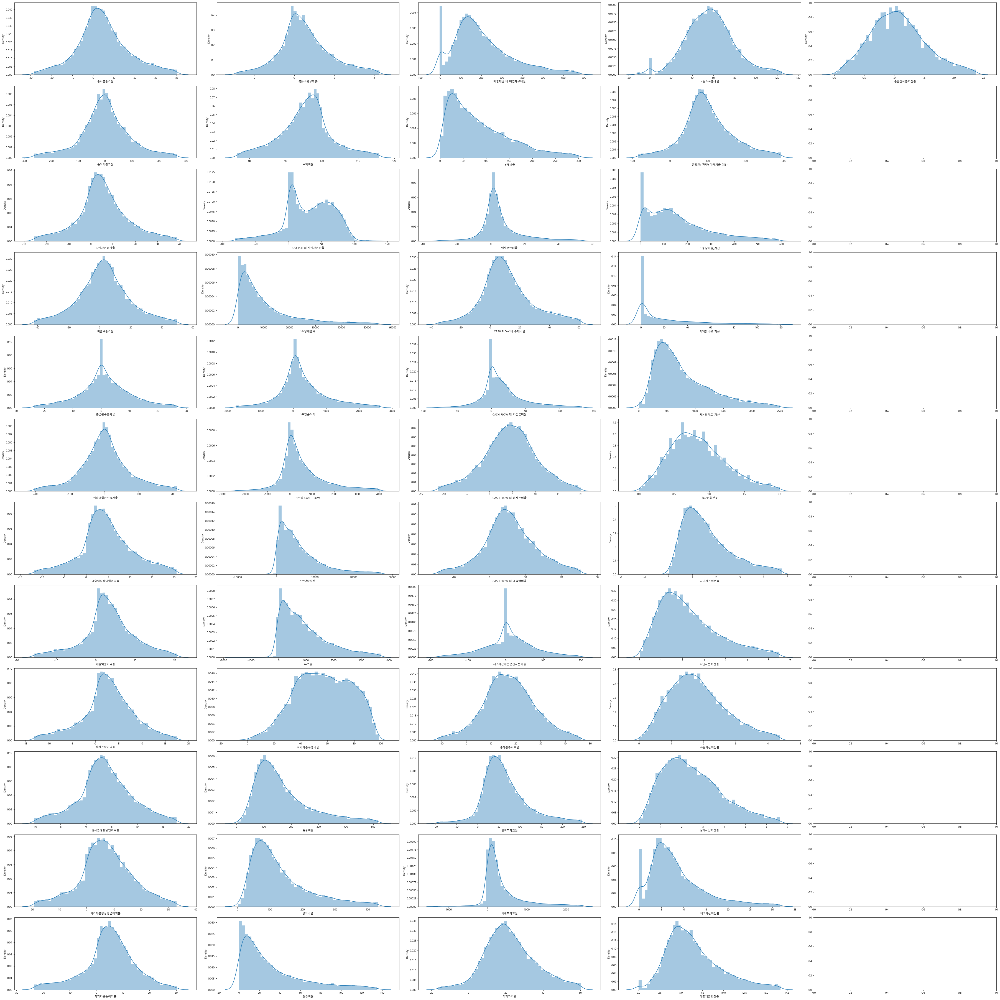

In [78]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(iqr_df, axs.T.ravel()):
    sns.distplot(iqr_df[col], ax=ax)

plt.show()

### IQR 박스플롯

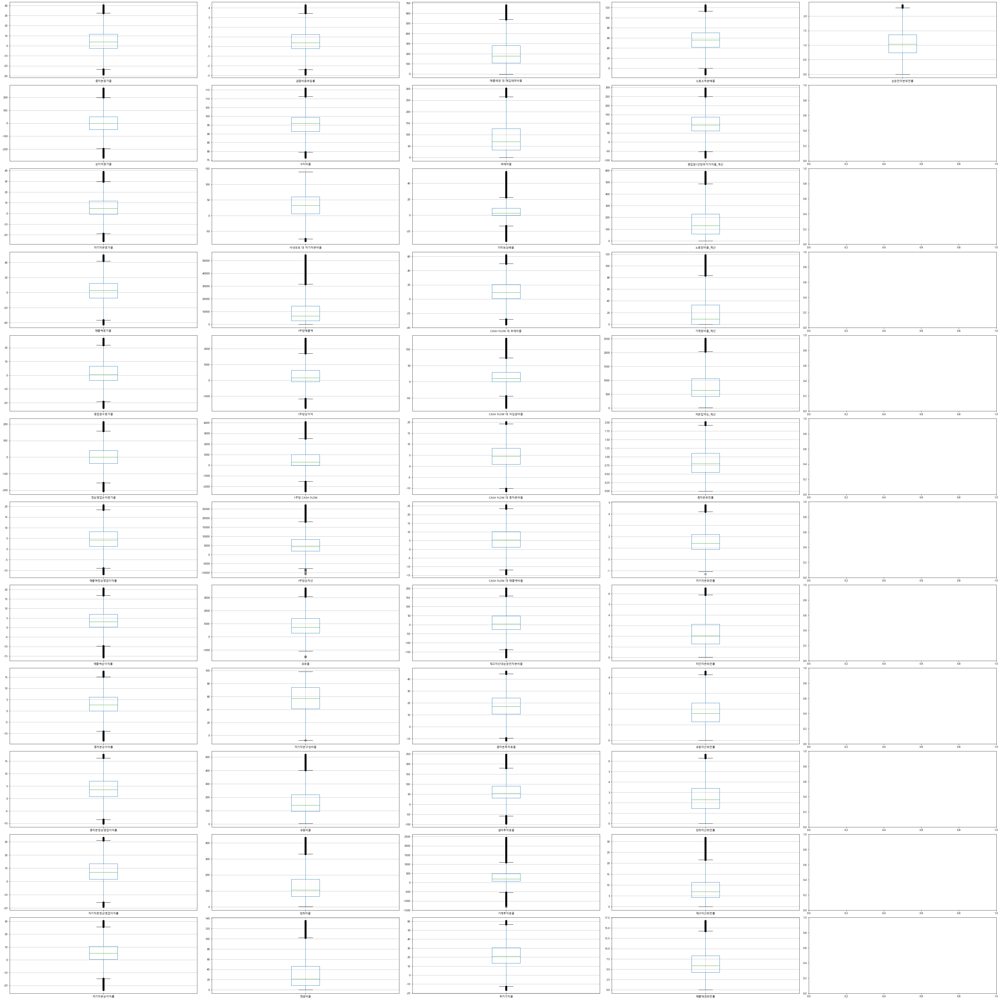

In [79]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(iqr_df.columns, axs.T.ravel()):
    iqr_df[[col]].boxplot(ax=ax)

plt.show()

### IQR Q-Q Plot

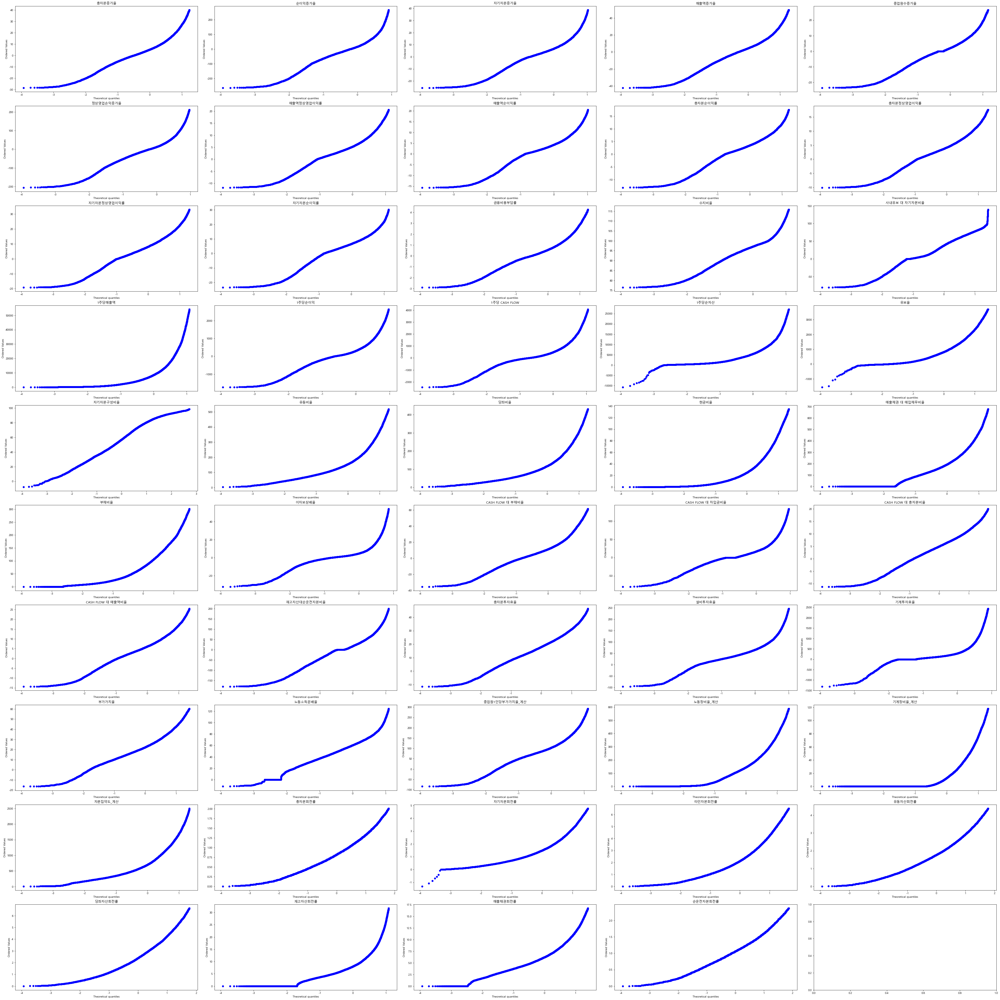

In [80]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), iqr_df):
        stats.probplot(iqr_df[i], dist='norm', plot=ax)
        ax.set_title(str(i))

plt.show()

### IQR K-S Test

In [81]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [82]:
ks_test(iqr_df)

총자본증가율 의 pvalue: nan
순이익증가율 의 pvalue: nan
자기자본증가율 의 pvalue: nan
매출액증가율 의 pvalue: nan
종업원수증가율 의 pvalue: nan
정상영업손익증가율 의 pvalue: nan
매출액정상영업이익률 의 pvalue: nan
매출액순이익률 의 pvalue: nan
총자본순이익률 의 pvalue: nan
총자본정상영업이익률 의 pvalue: nan
자기자본정상영업이익률 의 pvalue: nan
자기자본순이익률 의 pvalue: nan
금융비용부담률 의 pvalue: nan
수지비율 의 pvalue: nan
사내유보 대 자기자본비율 의 pvalue: nan
1주당매출액 의 pvalue: nan
1주당순이익 의 pvalue: nan
1주당 CASH FLOW 의 pvalue: nan
1주당순자산 의 pvalue: nan
유보율 의 pvalue: nan
자기자본구성비율 의 pvalue: nan
유동비율 의 pvalue: nan
당좌비율 의 pvalue: nan
현금비율 의 pvalue: nan
매출채권 대 매입채무비율 의 pvalue: nan
부채비율 의 pvalue: nan
이자보상배율 의 pvalue: nan
CASH FLOW 대 부채비율 의 pvalue: nan
CASH FLOW 대 차입금비율 의 pvalue: nan
CASH FLOW 대 총자본비율 의 pvalue: nan
CASH FLOW 대 매출액비율 의 pvalue: nan
재고자산대순운전자본비율 의 pvalue: nan
총자본투자효율 의 pvalue: nan
설비투자효율 의 pvalue: nan
기계투자효율 의 pvalue: nan
부가가치율 의 pvalue: nan
노동소득분배율 의 pvalue: nan
종업원1인당부가가치율_계산 의 pvalue: nan
노동장비율_계산 의 pvalue: nan
기계장비율_계산 의 pvalue: nan
자본집약도_계산 의 pvalue: nan
총자본회전률 의 pvalue: nan
자기자본회전률 의 pvalue: nan

### IQR Shapiro–Wilk test

In [83]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [84]:
# 컬럼별 pvalue 값 출력
shap_pct(iqr_df)

총자본증가율 의 pvalue: 1.0
순이익증가율 의 pvalue: 1.0
자기자본증가율 의 pvalue: 1.0
매출액증가율 의 pvalue: 1.0
종업원수증가율 의 pvalue: 1.0
정상영업손익증가율 의 pvalue: 1.0
매출액정상영업이익률 의 pvalue: 1.0
매출액순이익률 의 pvalue: 1.0
총자본순이익률 의 pvalue: 1.0
총자본정상영업이익률 의 pvalue: 1.0
자기자본정상영업이익률 의 pvalue: 1.0
자기자본순이익률 의 pvalue: 1.0
금융비용부담률 의 pvalue: 1.0
수지비율 의 pvalue: 1.0
사내유보 대 자기자본비율 의 pvalue: 1.0
1주당매출액 의 pvalue: 1.0
1주당순이익 의 pvalue: 1.0
1주당 CASH FLOW 의 pvalue: 1.0
1주당순자산 의 pvalue: 1.0
유보율 의 pvalue: 1.0
자기자본구성비율 의 pvalue: 1.0
유동비율 의 pvalue: 1.0
당좌비율 의 pvalue: 1.0
현금비율 의 pvalue: 1.0
매출채권 대 매입채무비율 의 pvalue: 1.0
부채비율 의 pvalue: 1.0
이자보상배율 의 pvalue: 1.0
CASH FLOW 대 부채비율 의 pvalue: 1.0
CASH FLOW 대 차입금비율 의 pvalue: 1.0
CASH FLOW 대 총자본비율 의 pvalue: 1.0
CASH FLOW 대 매출액비율 의 pvalue: 1.0
재고자산대순운전자본비율 의 pvalue: 1.0
총자본투자효율 의 pvalue: 1.0
설비투자효율 의 pvalue: 1.0
기계투자효율 의 pvalue: 1.0
부가가치율 의 pvalue: 1.0
노동소득분배율 의 pvalue: 1.0
종업원1인당부가가치율_계산 의 pvalue: 1.0
노동장비율_계산 의 pvalue: 1.0
기계장비율_계산 의 pvalue: 1.0
자본집약도_계산 의 pvalue: 1.0
총자본회전률 의 pvalue: 1.0
자기자본회전률 의 pvalue: 1.0

### IQR 등분산, 이분산 확인

In [85]:
iqr_df['부실기업'] = df_part7.iloc[:, 7]
iqr_df.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,13.166482,80.280163,5.219839,NaN,4.65,NaN,3.61,-8.50,-5.58,2.37,...,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86,0
1,NaN,NaN,NaN,-8.429134,-0.74,NaN,NaN,NaN,NaN,-9.96,...,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42,0
2,-2.093352,NaN,NaN,25.510008,1.49,NaN,3.88,1.45,0.52,1.40,...,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42,0
3,3.855597,-46.641074,0.010946,11.520576,20.59,-44.098325,1.94,0.69,0.28,0.78,...,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56,0
4,-2.644307,NaN,-4.480893,18.851969,-4.88,NaN,-9.51,-13.50,-6.37,-4.49,...,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75,0


In [86]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = iqr_df.iloc[:, :-1]

nc_df = iqr_df[iqr_df['부실기업'] ==0]  # normal company 
bc_df = iqr_df[iqr_df['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue nan -> 이분산
**********************************************************
순이익증가율 pvalue nan -> 이분산
**********************************************************
자기자본증가율 pvalue nan -> 이분산
**********************************************************
매출액증가율 pvalue nan -> 이분산
**********************************************************
종업원수증가율 pvalue nan -> 이분산
**********************************************************
정상영업손익증가율 pvalue nan -> 이분산
**********************************************************
매출액정상영업이익률 pvalue nan -> 이분산
**********************************************************
매출액순이익률 pvalue nan -> 이분산
**********************************************************
총자본순이익률 pvalue nan -> 이분산
**********************************************************
총자본정상영업이익률 pvalue nan -> 이분산
**********************************************************
자기자본정상영업이익률 pvalue nan -> 이분산
**********************************************************
자기자본순이익률 pvalue nan -> 이분산
*****************************

In [87]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,이분산
순이익증가율,이분산
자기자본증가율,이분산
매출액증가율,이분산
종업원수증가율,이분산
정상영업손익증가율,이분산
매출액정상영업이익률,이분산
매출액순이익률,이분산
총자본순이익률,이분산
총자본정상영업이익률,이분산


In [88]:
lev_sced_df.value_counts()

등분산성
이분산     49
dtype: int64

### IQR Welch's ttest_ind

In [89]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = iqr_df.iloc[:, :-1]

nc_df = iqr_df.iloc[:, :-1][iqr_df['부실기업'] ==0]  # normal company 
bc_df = iqr_df.iloc[:, :-1][iqr_df['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [90]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: nan
**********************************************************
등

In [91]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [92]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: nan
**********************************************************
이

## 윈저라이징

In [93]:
wins_df_part5 = df_part7.copy()

In [94]:
# 윈저라이징 할 컬럼 데이터프레임
wins_df_part5 = wins_df_part5.iloc[:, 10:]

In [95]:
from scipy.stats.mstats import winsorize

# 윈저라이징 함수 생성
def winsorize_col(winsordf, col):
    winsordf[col] = winsorize(winsordf[col], limits=[0.025, 0.025])

In [96]:
# 윈저라이징 적용
for i in wins_df_part5.columns:
    winsorize_col(wins_df_part5, i)

### 윈저라이징 후 히스토그램

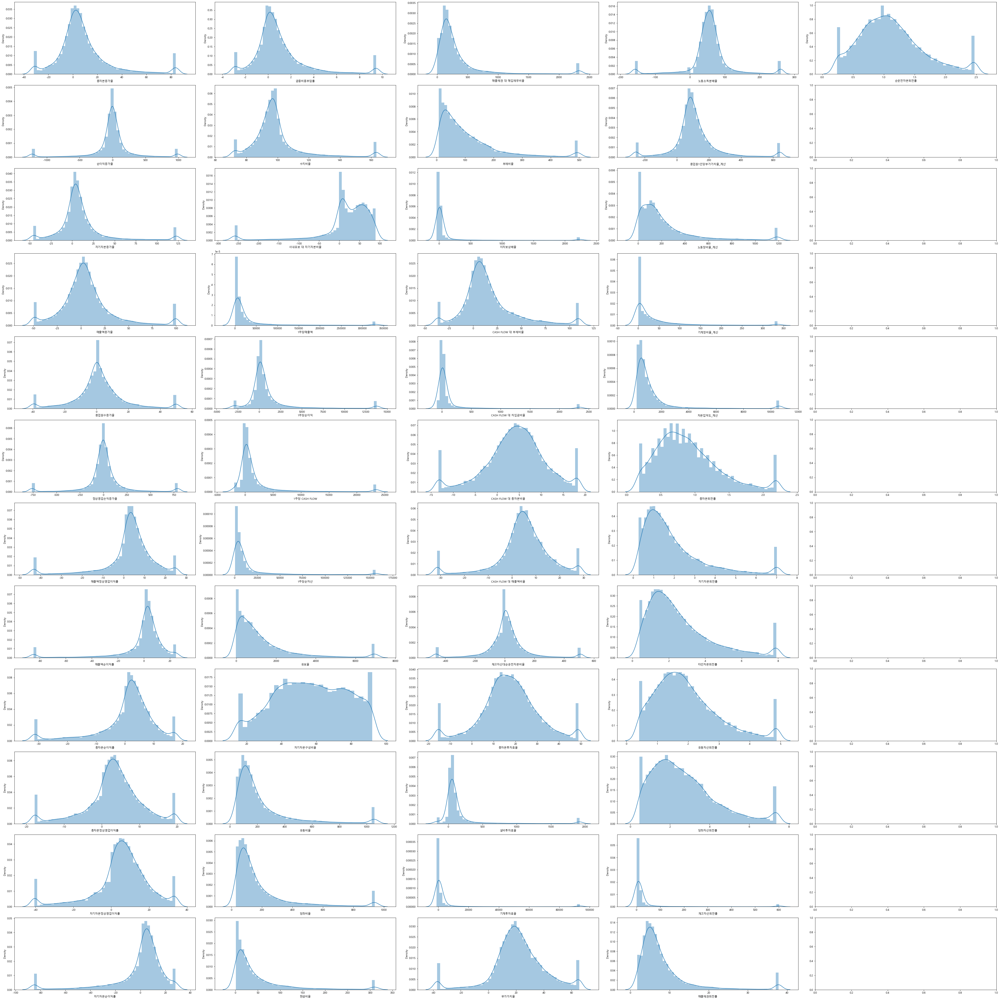

In [97]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(wins_df_part5, axs.T.ravel()):
    sns.distplot(wins_df_part5[col], ax=ax)

plt.show()

### 윈저라이징 후 박스플롯

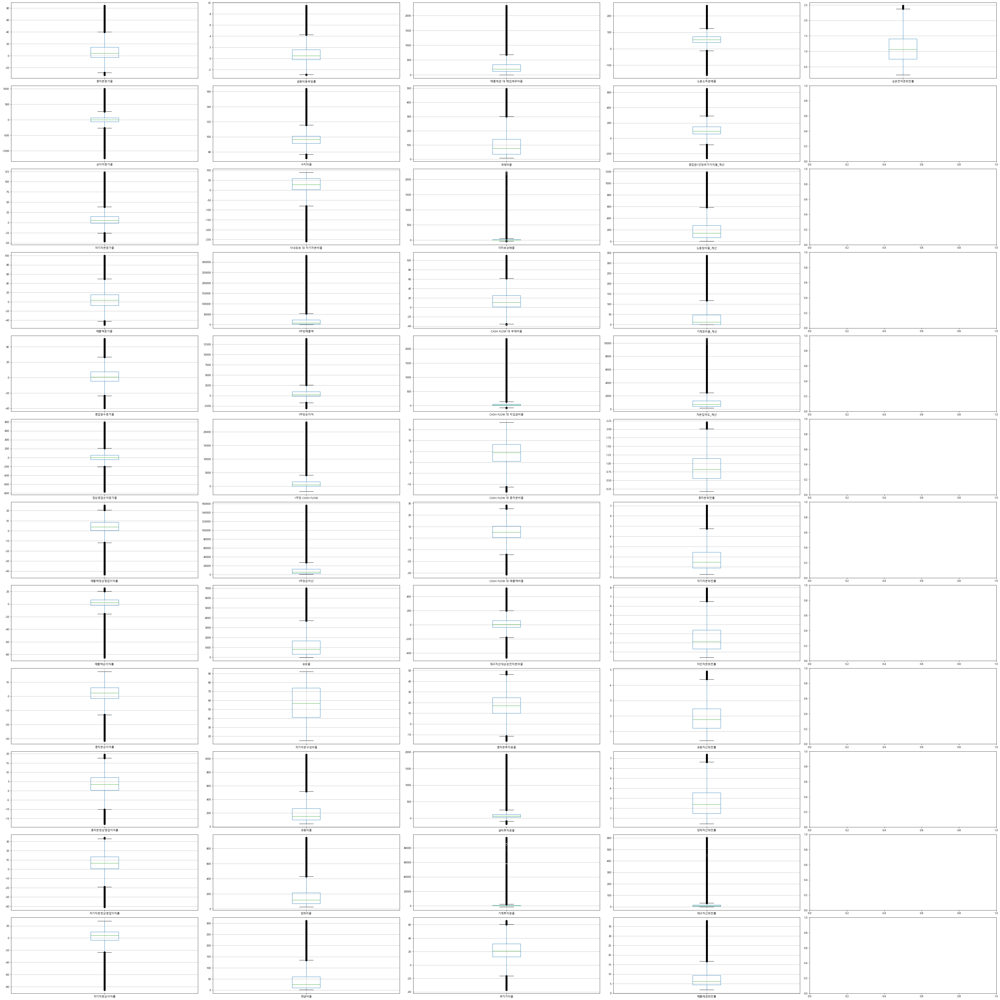

In [98]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(wins_df_part5.columns, axs.T.ravel()):
    wins_df_part5[[col]].boxplot(ax=ax)

plt.show()

### 윈저라이징 후 Q-Q Plot

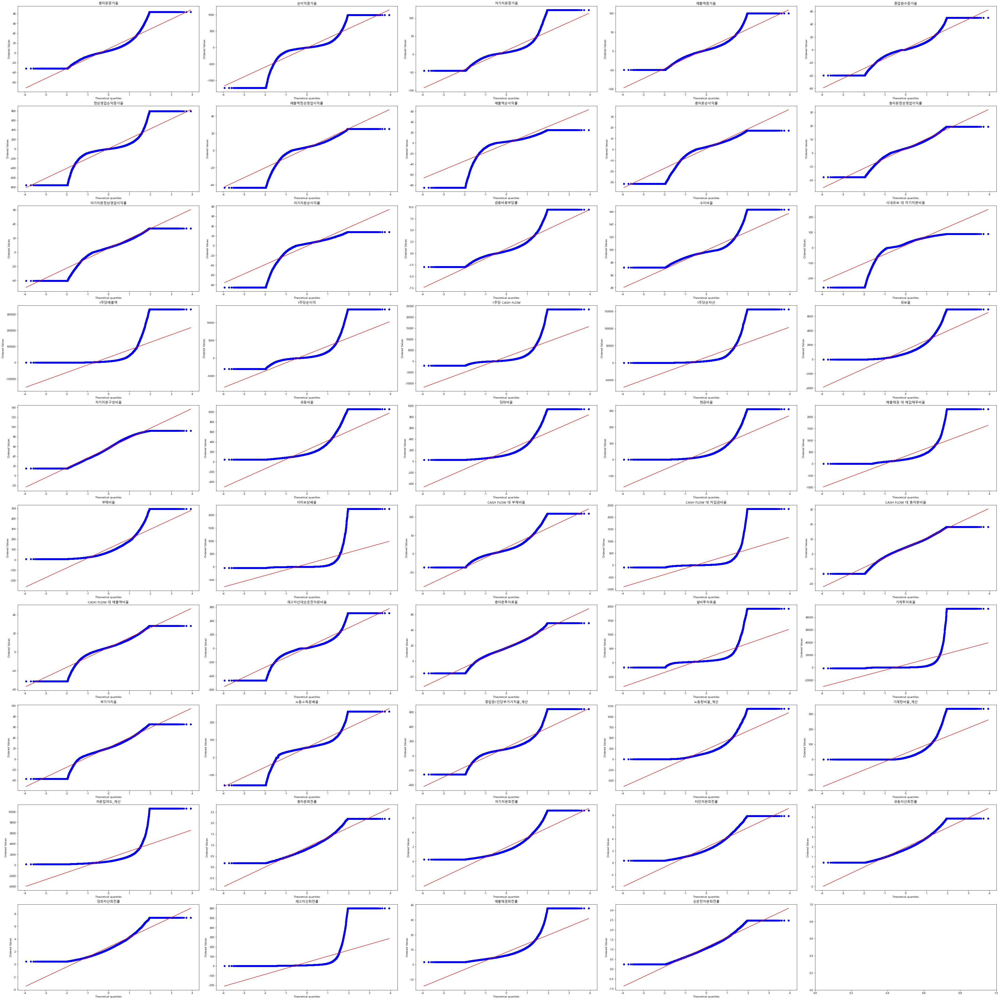

In [99]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), wins_df_part5):
        stats.probplot(wins_df_part5[i], dist='norm', plot=ax)
        ax.set_title(str(i))

plt.show()

### 윈저라이징 K-S Test

In [100]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [101]:
ks_test(wins_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 윈저라이징 Shapiro–Wilk test

In [102]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [103]:
# 컬럼별 pvalue 값 출력
shap_pct(wins_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 4.1016006050787396e-42
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 4.4309057441950716e-42
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회

### 윈저라이징 등분산, 이분산 확인

In [104]:
wins_df_part5['부실기업'] = df_part7.iloc[:, 7]
wins_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,13.166482,80.280163,5.219839,56.396905,4.65,790.705855,3.61,-8.50,-5.58,2.37,...,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86,0
1,83.900297,-341.571868,75.170505,-8.429134,-0.74,-756.819406,-25.87,-40.97,-15.78,-9.96,...,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42,0
2,-2.093352,989.742554,55.100407,25.510008,1.49,631.501169,3.88,1.45,0.52,1.40,...,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42,0
3,3.855597,-46.641074,0.010946,11.520576,20.59,-44.098325,1.94,0.69,0.28,0.78,...,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56,0
4,-2.644307,-1225.486100,-4.480893,18.851969,-4.88,-681.514824,-9.51,-13.50,-6.37,-4.49,...,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75,0


In [105]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = wins_df_part5.iloc[:, :-1]

nc_df = wins_df_part5[wins_df_part5['부실기업'] ==0]  # normal company 
bc_df = wins_df_part5[wins_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.0 -> 등분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
*****************************

In [106]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,등분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [107]:
lev_sced_df.value_counts()

등분산성
등분산     44
이분산      5
dtype: int64

### 윈저라이징 Welch's ttest_ind

In [108]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = wins_df_part5.iloc[:, :-1]

nc_df = wins_df_part5.iloc[:, :-1][wins_df_part5['부실기업'] ==0]  # normal company 
bc_df = wins_df_part5.iloc[:, :-1][wins_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [109]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등

In [110]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [111]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이

## OLS

In [112]:
import statsmodels.api as sm

model = sm.OLS(df_part7['부실기업'], df_part7.iloc[:, 10:])
results = model.fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                   부실기업   R-squared (uncentered):                   0.442
Model:                            OLS   Adj. R-squared (uncentered):              0.440
Method:                 Least Squares   F-statistic:                              267.6
Date:                Tue, 27 Sep 2022   Prob (F-statistic):                        0.00
Time:                        16:40:44   Log-Likelihood:                         -5081.9
No. Observations:               16634   AIC:                                  1.026e+04
Df Residuals:                   16585   BIC:                                  1.064e+04
Df Model:                          49                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

In [113]:
df_part7.head(1)

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,(주)CMG제약,58820,201112,200108,NaN,0.0,0,0,제조업,1,...,19.715837,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86


In [114]:
log_reg = sm.Logit(df_part7.iloc[:, 7], df_part7.iloc[:, 10:]).fit()
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.295728
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                   부실기업   No. Observations:                16634
Model:                          Logit   Df Residuals:                    16585
Method:                           MLE   Df Model:                           48
Date:                Tue, 27 Sep 2022   Pseudo R-squ.:                  0.3974
Time:                        16:40:45   Log-Likelihood:                -4919.1
converged:                       True   LL-Null:                       -8163.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
총자본증가율               -0.0030      0.001     -3.561      0.000      -0.005      -0.001
순이익증가율 

## 상관관계

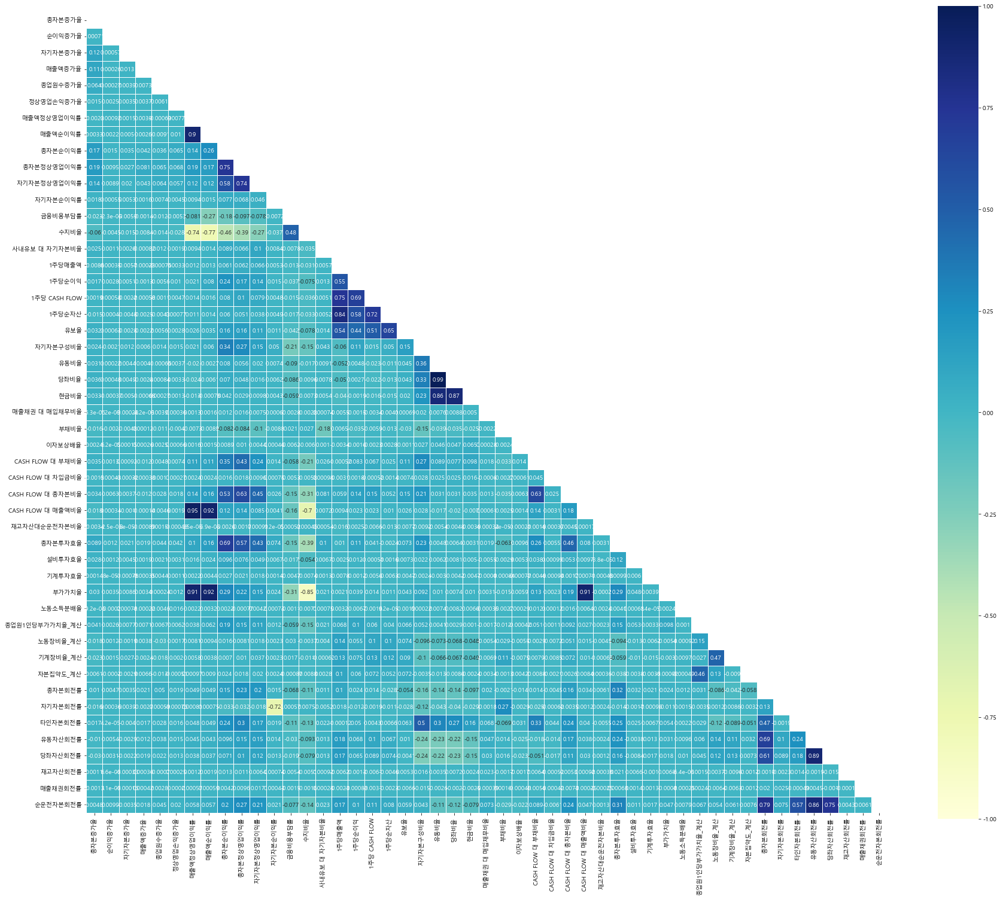

In [115]:
# 상관계수 히트맵

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

plt.figure(figsize=(30,25))

df_part4_corr = df_part7.iloc[:, 10:].corr()

mask = np.zeros_like(df_part4_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_part7.iloc[:, 10:].corr(), annot=True, mask=mask, linewidths=.5, cmap="YlGnBu", square=True, vmin=-1, vmax=1)

plt.show()

In [116]:
# VIF

import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

def feature_engineering_XbyVIF(df_cols):
    vif = pd.DataFrame()
    vif['VIF_Factor'] = [variance_inflation_factor(df_cols.values, i)
                        for i in range(df_cols.shape[1])]
    vif['Feature'] = df_cols.columns
    return vif

In [117]:
feature_vif = feature_engineering_XbyVIF(df_part7.iloc[:, 10:])
feature_vif

,VIF_Factor,Feature
0,1.162652,총자본증가율
1,1.000714,순이익증가율
2,1.019699,자기자본증가율
3,1.027068,매출액증가율
4,1.017399,종업원수증가율
5,1.007160,정상영업손익증가율
6,19.600001,매출액정상영업이익률
7,10.816105,매출액순이익률
8,4.380014,총자본순이익률
9,5.180754,총자본정상영업이익률


In [118]:
feature_vif_df = pd.DataFrame(feature_vif)
feature_vif_df.sort_values('VIF_Factor', ascending=False).reset_index(drop=True)

,VIF_Factor,Feature
0,121.852463,유동비율
1,113.412564,당좌비율
2,50.016486,순운전자본회전률
3,43.601828,유동자산회전률
4,19.600001,매출액정상영업이익률
5,19.426603,CASH FLOW 대 매출액비율
6,17.865911,당좌자산회전률
7,16.906048,부가가치율
8,14.111516,수지비율
9,13.936761,총자본회전률
